In [1]:
!pip install feature_engine

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.1/357.1 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 44.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0.3:
      Successfully uninstalled pandas-2.0.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 2.2.2 which is incompatible.
google-colab 1.0.0 requires pandas==2.0.3, but you have pandas 2.2.2 which is incompatible.


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from feature_engine.datetime import DatetimeFeatures
from feature_engine.timeseries.forecasting import LagFeatures
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings("ignore")

In [3]:
data = pd.read_csv("/content/store5.csv")

In [4]:
data.head()

,id,date,store_nbr,family,sales,onpromotion,dcoilwtico
0,1452,2013-01-01,5,AUTOMOTIVE,0.0,0,NaN
1,1453,2013-01-01,5,BABY CARE,0.0,0,NaN
2,1454,2013-01-01,5,BEAUTY,0.0,0,NaN
3,1455,2013-01-01,5,BEVERAGES,0.0,0,NaN
4,1456,2013-01-01,5,BOOKS,0.0,0,NaN


In [5]:
data = data.drop(columns=["id","dcoilwtico"])

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55572 entries, 0 to 55571
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         55572 non-null  object 
 1   store_nbr    55572 non-null  int64  
 2   family       55572 non-null  object 
 3   sales        55572 non-null  float64
 4   onpromotion  55572 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 2.1+ MB


In [7]:
data['date'] = pd.to_datetime(data['date'])
data['raw_date'] = pd.to_datetime(data['date'])

In [8]:
data = data.set_index('date')

In [9]:
data['date'] = data['raw_date']
data = data.drop(columns=['raw_date'])

data

,store_nbr,family,sales,onpromotion,date
date,,,,,
2013-01-01,5,AUTOMOTIVE,0.000,0,2013-01-01
2013-01-01,5,BABY CARE,0.000,0,2013-01-01
2013-01-01,5,BEAUTY,0.000,0,2013-01-01
2013-01-01,5,BEVERAGES,0.000,0,2013-01-01
2013-01-01,5,BOOKS,0.000,0,2013-01-01
...,...,...,...,...,...
2017-08-15,5,POULTRY,241.011,1,2017-08-15
2017-08-15,5,PREPARED FOODS,52.121,0,2017-08-15
2017-08-15,5,PRODUCE,1357.823,4,2017-08-15


In [10]:
print('Jumlah kategori produk : ',len(data['family'].unique()))
data['family'].value_counts()

Jumlah kategori produk :  33


family
AUTOMOTIVE                    1684
HOME APPLIANCES               1684
SCHOOL AND OFFICE SUPPLIES    1684
PRODUCE                       1684
PREPARED FOODS                1684
POULTRY                       1684
PLAYERS AND ELECTRONICS       1684
PET SUPPLIES                  1684
PERSONAL CARE                 1684
MEATS                         1684
MAGAZINES                     1684
LIQUOR,WINE,BEER              1684
LINGERIE                      1684
LAWN AND GARDEN               1684
LADIESWEAR                    1684
HOME CARE                     1684
HOME AND KITCHEN II           1684
BABY CARE                     1684
HOME AND KITCHEN I            1684
HARDWARE                      1684
GROCERY II                    1684
GROCERY I                     1684
FROZEN FOODS                  1684
EGGS                          1684
DELI                          1684
DAIRY                         1684
CLEANING                      1684
CELEBRATION                   1684
BREAD/BAKERY 

In [11]:
for col in data.columns:
  null_data     = data[data[col].isnull()]
  filled_data   = data[data[col].isnull() == False]
  percentage_null = (len(null_data) / len(data)) * 100
  print(col,len(null_data),len(filled_data),percentage_null)

store_nbr 0 55572 0.0
family 0 55572 0.0
sales 0 55572 0.0
onpromotion 0 55572 0.0
date 0 55572 0.0


In [12]:
def plot_this(x,y,title= None,color = None):
  # Create the plot
  plt.figure(figsize=(48, 6))
  plt.plot(x, y, color=(color or 'b'))

  # Add title and labels
  plt.title(f"Line Plot {title or 'Data'}")
  plt.xticks(rotation=90)

  # Show the plot
  plt.grid(True)
  plt.show()


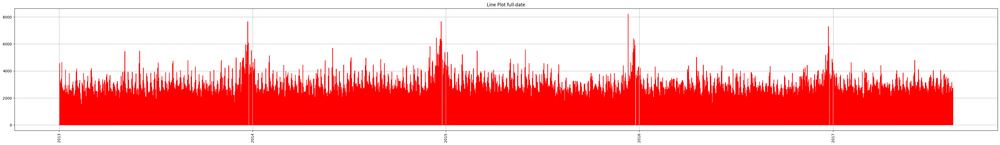

In [13]:
plot_this(data.index,data['sales'],f"full-date",'red')

In [14]:
def get_family_data(family=None,period=None):
  if family == None:
    return []

  family_data = data[data['family'] == family]

  if period == 'W':
    new_data = family_data.resample('W-MON').agg(
      sales=('sales', 'sum'),
      family=('family', 'first'),
      onpromotion=('onpromotion', 'sum')
    ).reset_index()
  elif period == 'M':
    new_data = family_data.resample('M').agg(
      sales=('sales', 'sum'),
      family=('family', 'first'),
      onpromotion=('onpromotion', 'sum')
    ).reset_index()
  elif period == 'Q':
    new_data = family_data.resample('Q').agg(
      sales=('sales', 'sum'),
      family=('family', 'first'),
      onpromotion=('onpromotion', 'sum')
    ).reset_index()
  else:
    new_data = family_data.resample('W-MON').agg(
      sales=('sales', 'sum'),
      family=('family', 'first'),
      onpromotion=('onpromotion', 'sum')
    ).reset_index()

  return new_data

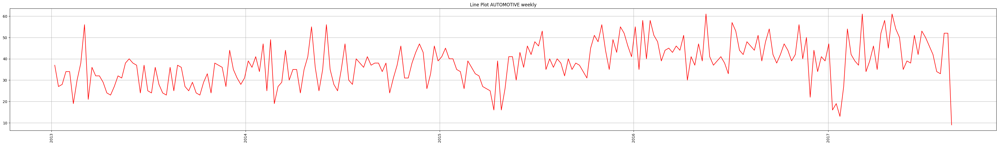

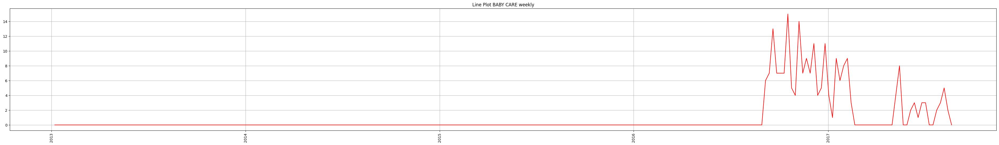

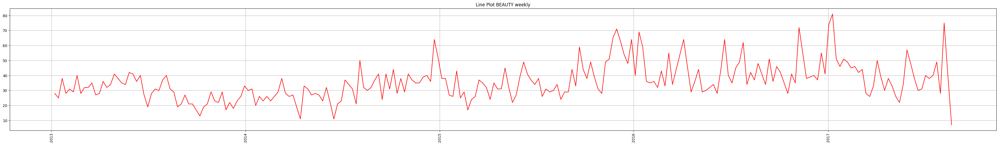

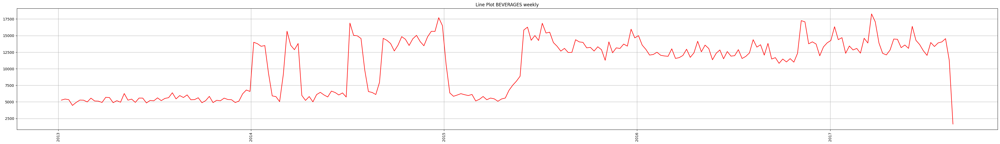

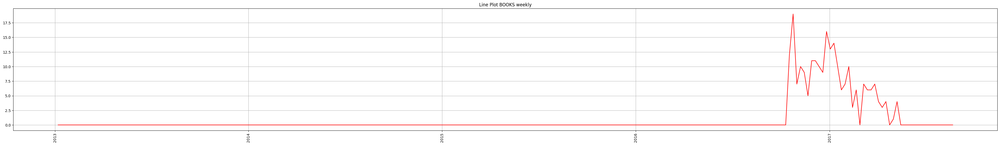

...

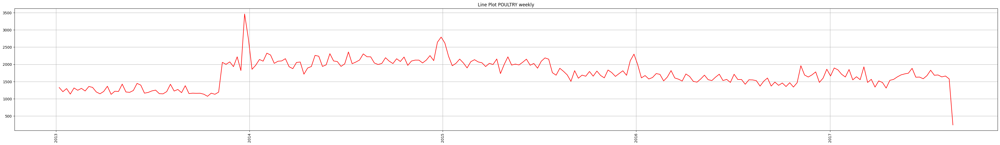

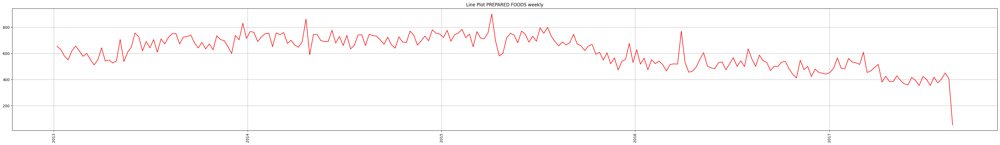

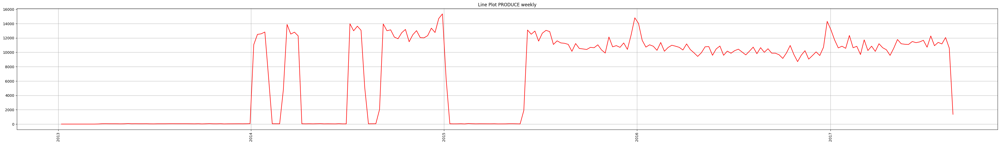

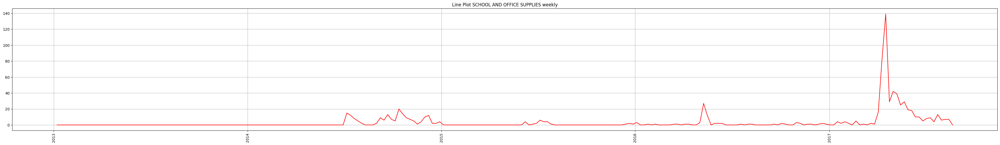

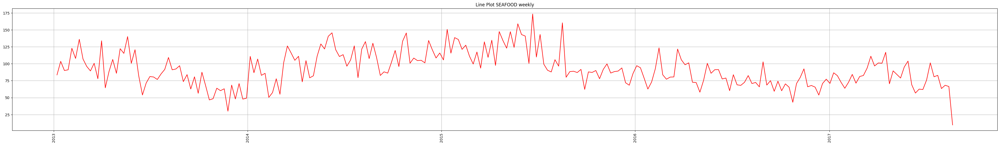

In [15]:
for family in data['family'].unique():
  fam_data_weekly     = get_family_data(family,'W')
  plot_this(fam_data_weekly['date'],fam_data_weekly['sales'],f"{family} weekly",'red')

In [16]:
familyScope = ['AUTOMOTIVE', 'BEAUTY', 'CLEANING', 'EGGS','DAIRY', 'DELI', 'LINGERIE', 'MEATS', 'PREPARED FOODS', 'FROZEN FOODS']

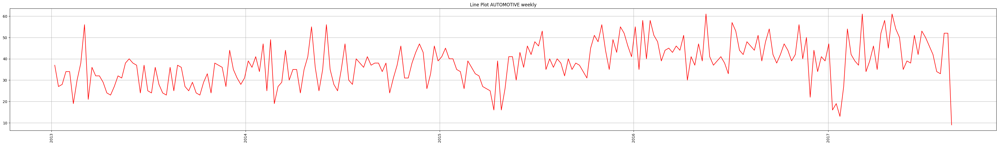

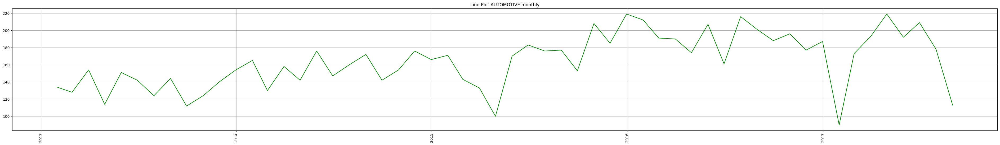

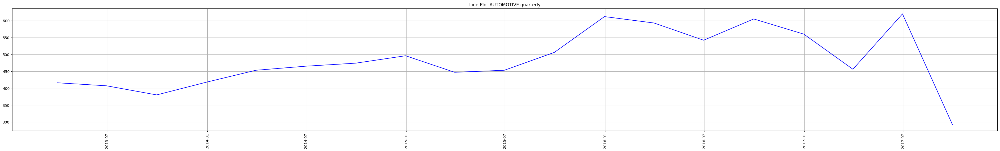

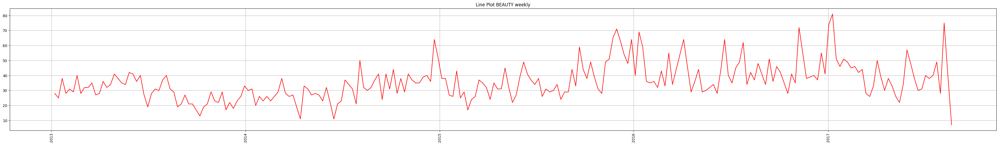

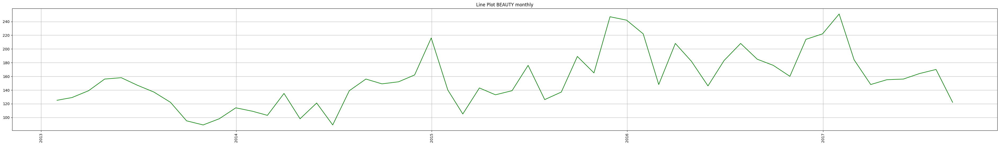

...

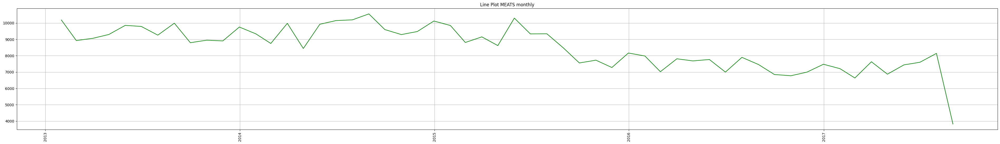

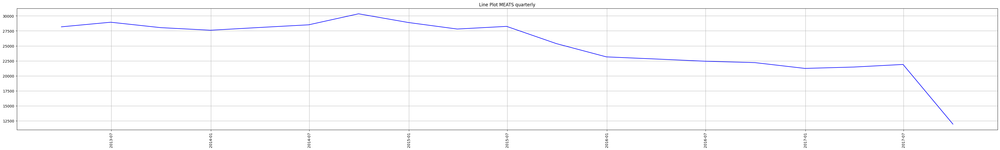

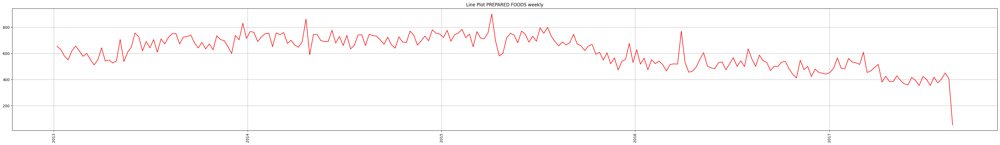

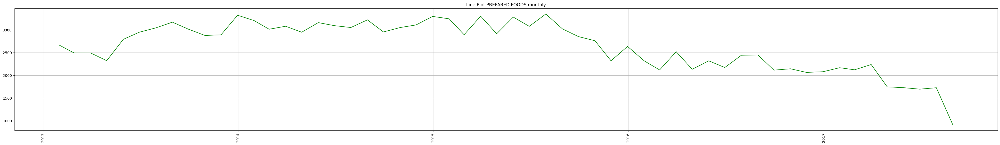

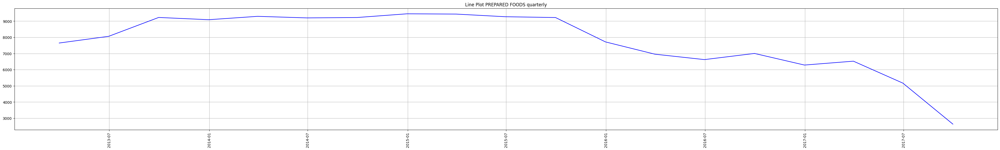

In [17]:
for family in data['family'].unique():
  if family in familyScope:
    fam_data_weekly     = get_family_data(family,'W')
    fam_data_monthly    = get_family_data(family,'M')
    fam_data_quarterly  = get_family_data(family,'Q')
    plot_this(fam_data_weekly['date'],fam_data_weekly['sales'],f"{family} weekly",'red')
    plot_this(fam_data_monthly['date'],fam_data_monthly['sales'],f"{family} monthly",'green')
    plot_this(fam_data_quarterly['date'],fam_data_quarterly['sales'],f"{family} quarterly",'blue')

In [18]:
def get_filtered_family_data(family,filter_since=None,filter_until=None,period=None):

  filtered_data = get_family_data(family,period)

  if filter_since != None:
    filter_date_since = pd.to_datetime(filter_since)
    filtered_data = filtered_data[(filtered_data['date'] > filter_date_since)]

  if filter_until != None:
    filter_date_until = pd.to_datetime(filter_until)
    filtered_data = filtered_data[(filtered_data['date'] < filter_date_until)]

  filtered_data = filtered_data[(filtered_data['sales'] > 0)]

  return filtered_data

In [19]:
def generate_filtered_data():

  filtered_data = {}

  for family in data['family'].unique():
    if family in familyScope:

      fam_data = get_filtered_family_data(family,None,'2017-12-31','W').reset_index()
      fam_data = fam_data[fam_data.index < len(fam_data.index) - 1]

      filtered_data[family] = fam_data

  return filtered_data

filtered_data = generate_filtered_data()

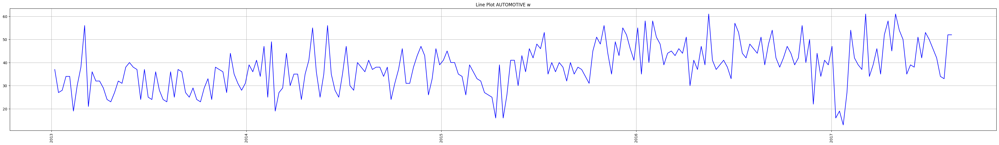

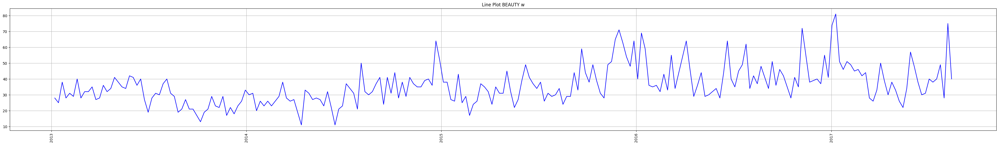

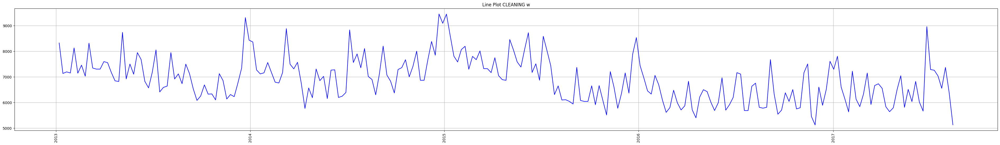

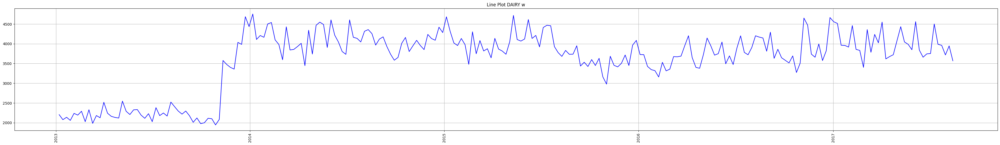

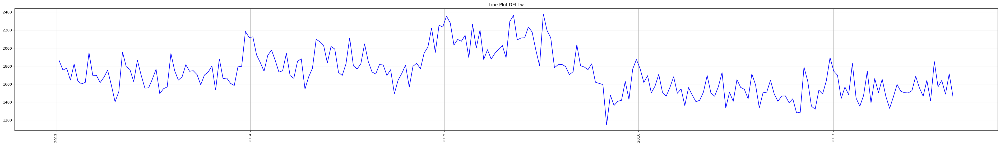

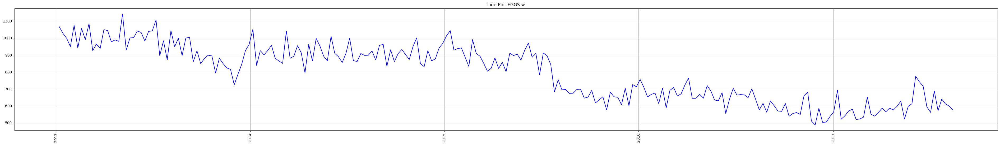

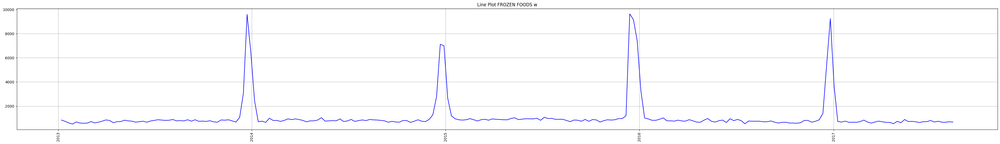

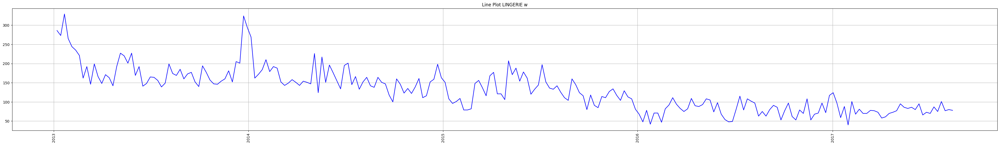

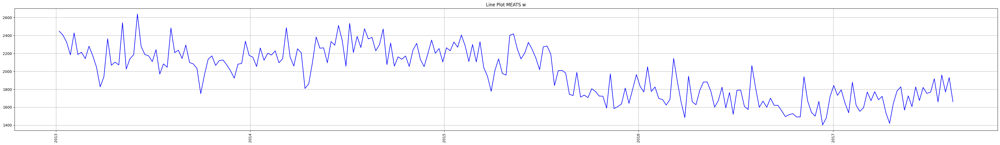

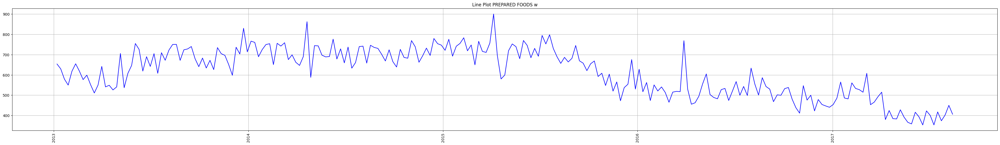

In [20]:
for family in data['family'].unique():
  if family in familyScope:
    plot_this(filtered_data[family]['date'],filtered_data[family]['sales'],f"{family} w",'blue')

In [21]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

In [22]:
def adf_test(series):
    result = adfuller(series)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    if result[1] <= 0.05:
      print("\033[91mThe series is stationary \033[0m")
    else:
      print("The series is not stationary")


-----------AUTOMOTIVE----------

ADF Statistic: -3.463880553692515
p-value: 0.008964643155455771
The series is stationary 


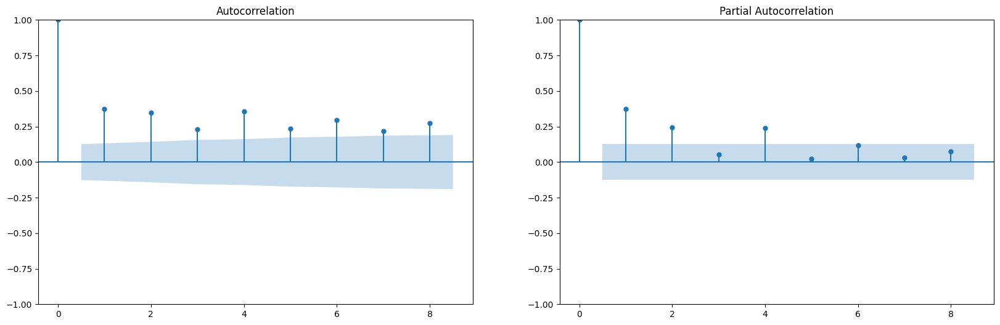


-----------BEAUTY----------

ADF Statistic: -4.099020220151748
p-value: 0.000972142486008524
The series is stationary 


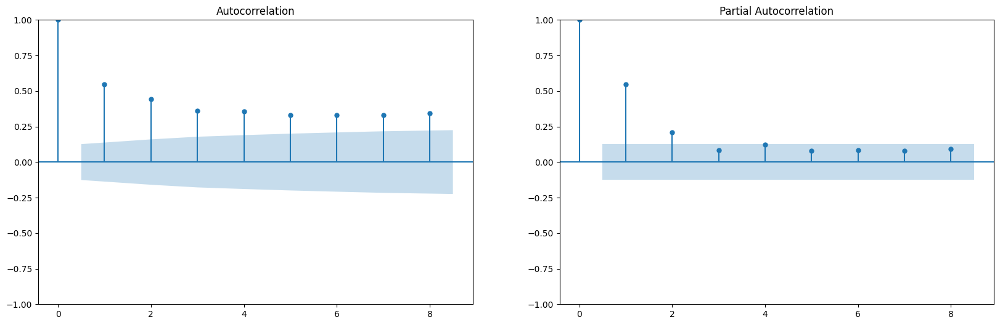


-----------CLEANING----------

ADF Statistic: -2.6626955574103066
p-value: 0.08071898973320057
The series is not stationary


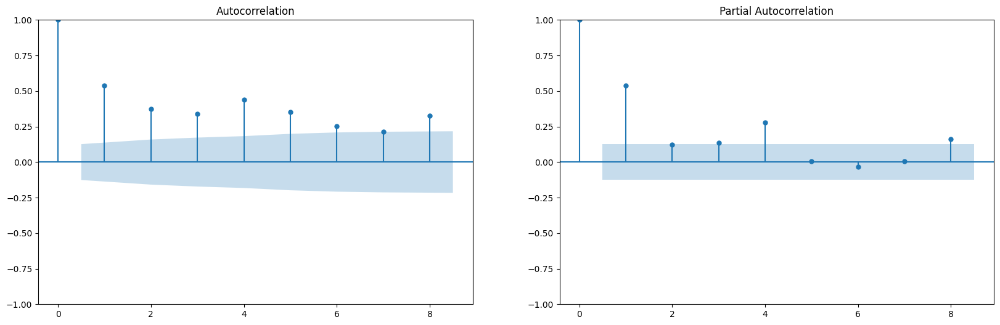


-----------EGGS----------

ADF Statistic: -1.061070006402484
p-value: 0.7303445392702426
The series is not stationary


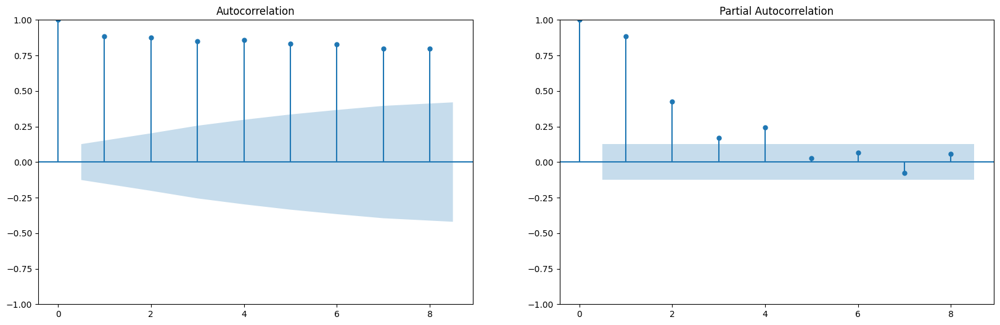


-----------DAIRY----------

ADF Statistic: -2.4376284442709997
p-value: 0.1313964148604767
The series is not stationary


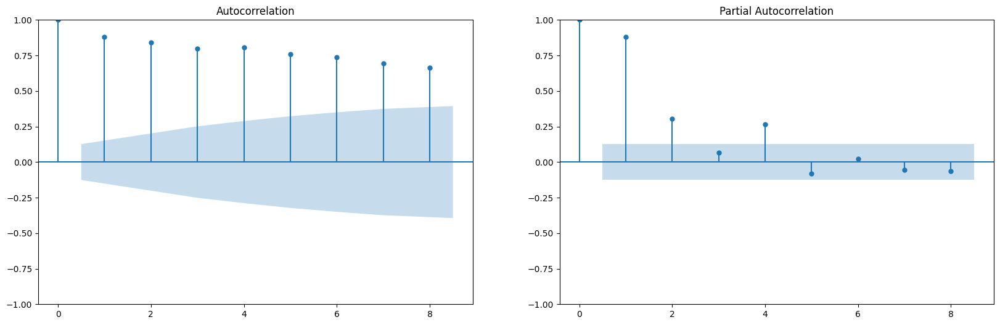


-----------DELI----------

ADF Statistic: -1.5496717701557505
p-value: 0.5088121470351734
The series is not stationary


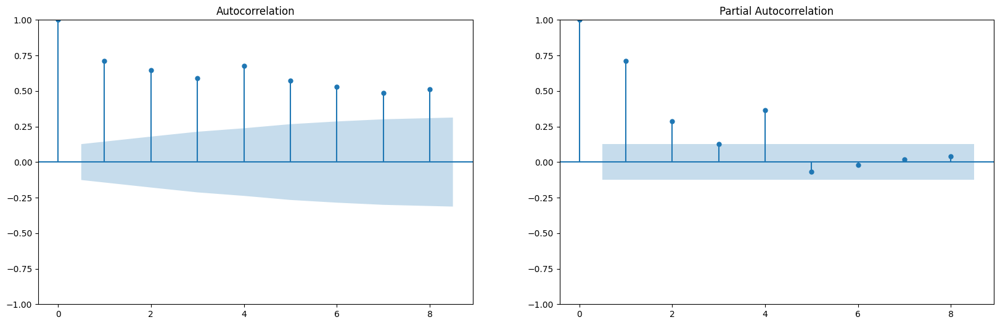


-----------LINGERIE----------

ADF Statistic: -1.604832663426018
p-value: 0.4811654486983555
The series is not stationary


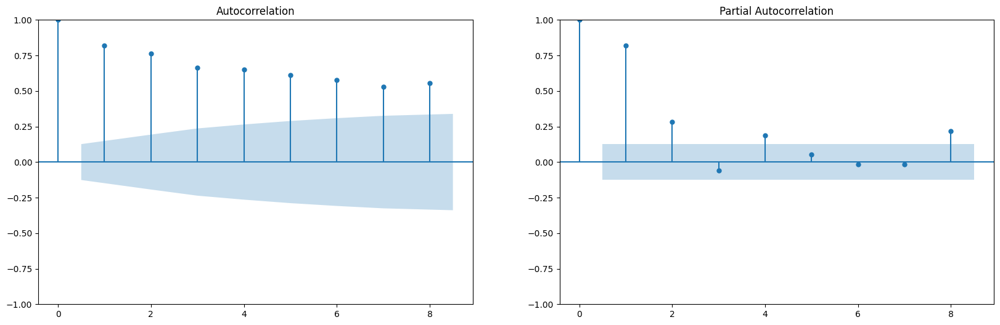


-----------MEATS----------

ADF Statistic: -0.9890025386545994
p-value: 0.7572542093616303
The series is not stationary


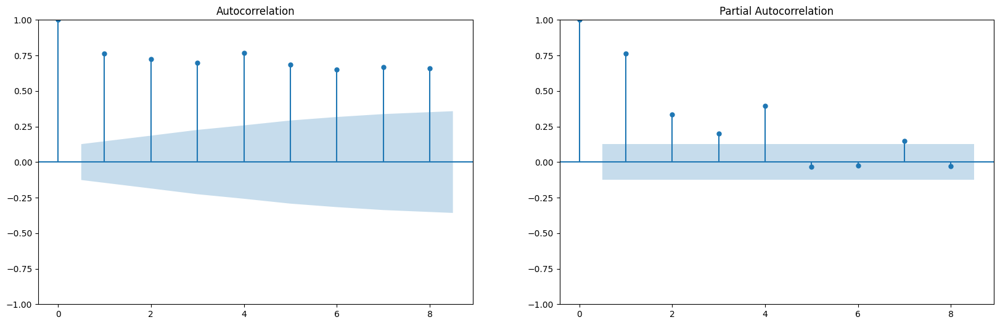


-----------PREPARED FOODS----------

ADF Statistic: -0.36546886694630676
p-value: 0.9157065591130504
The series is not stationary


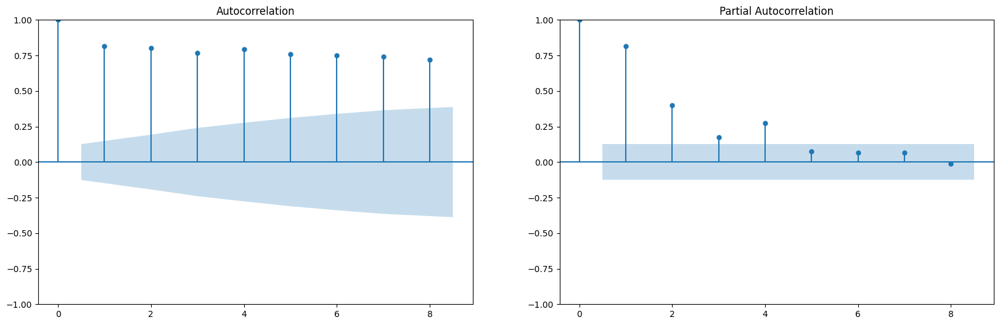


-----------FROZEN FOODS----------

ADF Statistic: -9.042993802144897
p-value: 5.0740406412512515e-15
The series is stationary 


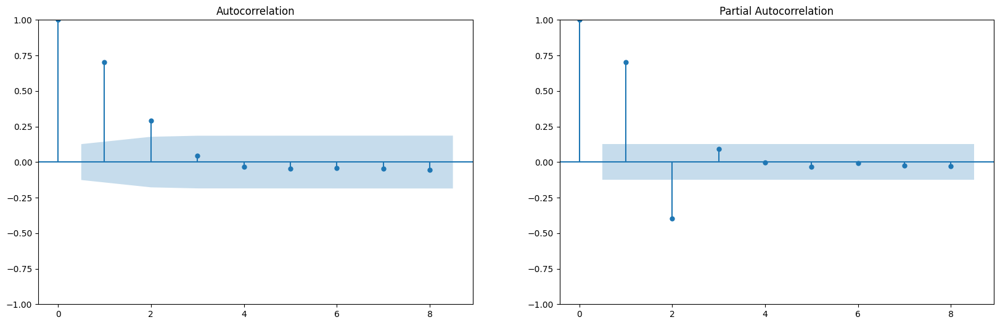

In [23]:
for family in familyScope:
  print(f"\n-----------{family}----------\n")

  family_data = filtered_data[family]['sales'].dropna()

  adf_test(family_data)
  fig, ax = plt.subplots(1, 2, figsize=(20, 6))
  plot_acf(family_data, lags=8,ax=ax[0])
  plot_pacf(family_data, lags=8,ax=ax[1])
  plt.show()


-----------AUTOMOTIVE DIFF 1----------

ADF Statistic: -9.45211416061082
p-value: 4.586730375148322e-16
The series is stationary 


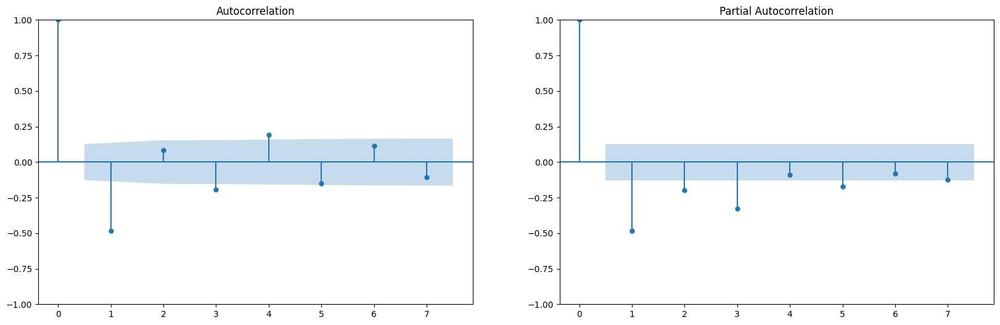


-----------BEAUTY DIFF 1----------

ADF Statistic: -9.195760243821129
p-value: 2.064879042100854e-15
The series is stationary 


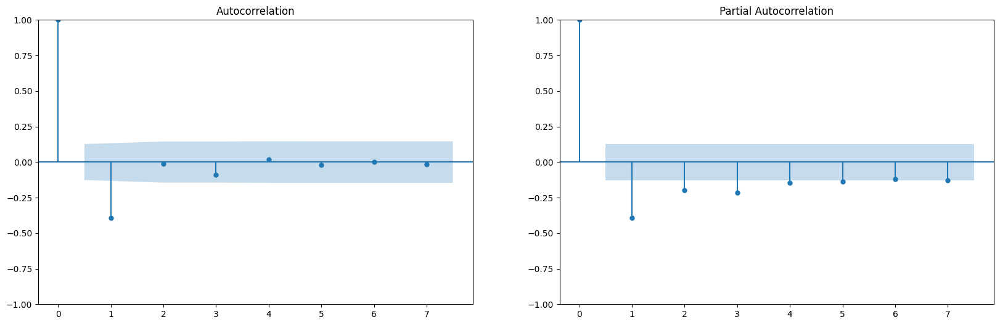


-----------CLEANING DIFF 1----------

ADF Statistic: -6.220330920865315
p-value: 5.242332223505374e-08
The series is stationary 


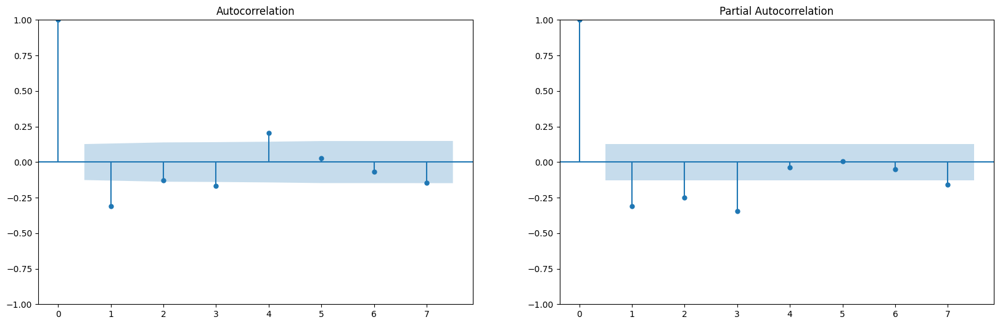


-----------EGGS DIFF 1----------

ADF Statistic: -5.855970689730574
p-value: 3.499536290055897e-07
The series is stationary 


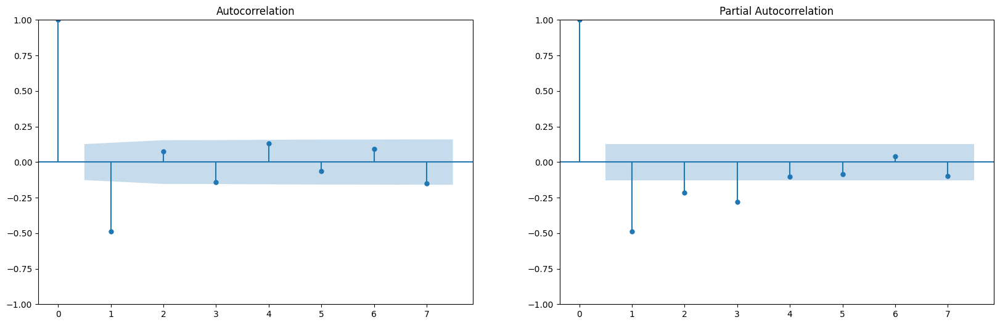


-----------DAIRY DIFF 1----------

ADF Statistic: -5.380546831003692
p-value: 3.7208784669903957e-06
The series is stationary 


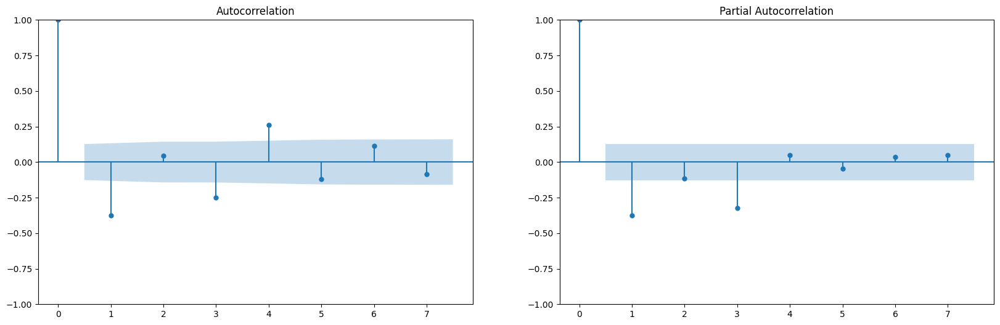


-----------DELI DIFF 1----------

ADF Statistic: -5.403173674935594
p-value: 3.3356012978018635e-06
The series is stationary 


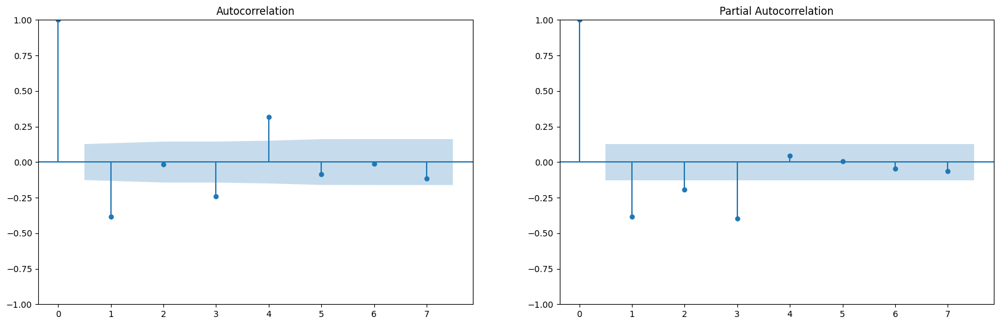


-----------LINGERIE DIFF 1----------

ADF Statistic: -7.051004659077683
p-value: 5.52684229922941e-10
The series is stationary 


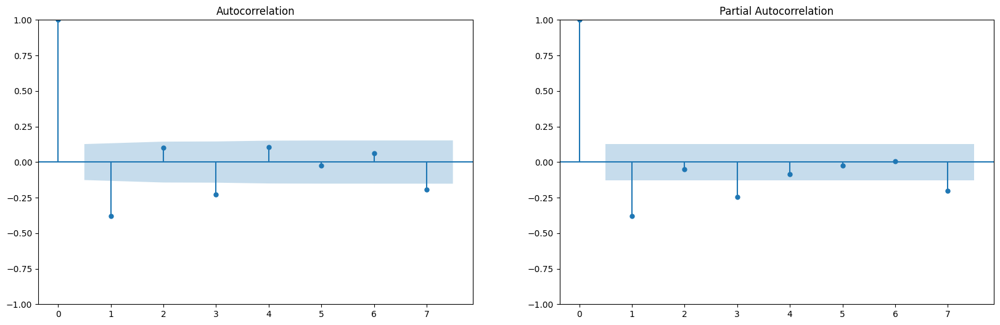


-----------MEATS DIFF 1----------

ADF Statistic: -5.444979036815863
p-value: 2.723227070118303e-06
The series is stationary 


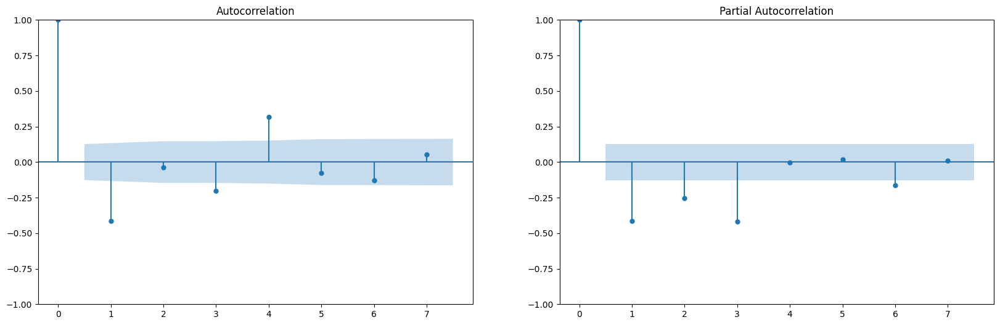


-----------PREPARED FOODS DIFF 1----------

ADF Statistic: -9.956055039668023
p-value: 2.4425821141728934e-17
The series is stationary 


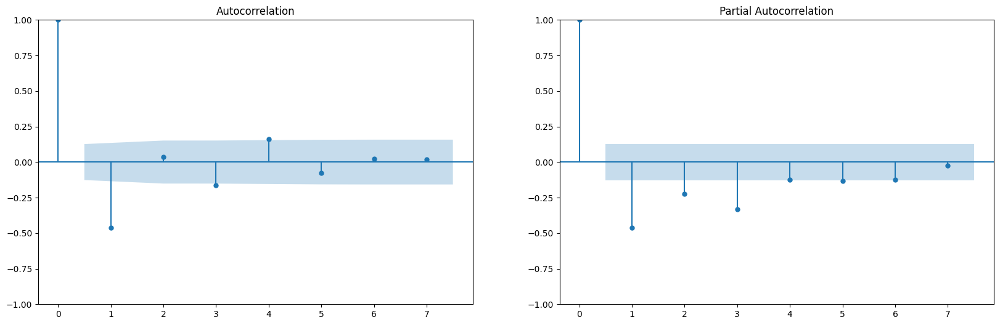


-----------FROZEN FOODS DIFF 1----------

ADF Statistic: -8.171323358598885
p-value: 8.607103483260934e-13
The series is stationary 


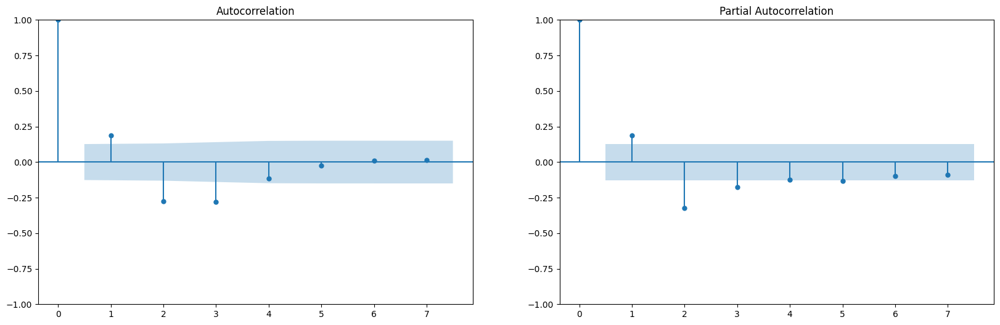

In [24]:
for family in familyScope:
  print(f"\n-----------{family} DIFF 1----------\n")

  family_data = filtered_data[family]['sales'].diff().dropna()

  adf_test(family_data)
  fig, ax = plt.subplots(1, 2, figsize=(20, 6))
  plot_acf(family_data, lags=7,ax=ax[0])
  plot_pacf(family_data, lags=7,ax=ax[1])
  plt.show()

In [25]:
# 'AUTOMOTIVE', 'BEAUTY', 'CLEANING', 'EGGS', 'HARDWARE', 'LINGERIE', 'MEATS', 'PREPARED FOODS', 'FROZEN FOODS'

p = {
    'AUTOMOTIVE':3,
    'BEAUTY': 5,
    'CLEANING':3,
    'EGGS':3,
    'LINGERIE':1,
    'MEATS':3,
    'DAIRY':3,
    'DELI':3,
    'PREPARED FOODS':3,
    'FROZEN FOODS':3,
}

q = {
    'AUTOMOTIVE':1,
    'BEAUTY':1,
    'CLEANING':1,
    'EGGS':1,
    'LINGERIE':1,
    'MEATS':1,
    'DELI':1,
    'DAIRY':1,
    'PREPARED FOODS':1,
    'FROZEN FOODS':3,
}

d = {
    'AUTOMOTIVE':1,
    'BEAUTY': 1,
    'CLEANING':1,
    'EGGS':1,
    'LINGERIE':1,
    'MEATS':1,
    'DELI':1,
    'DAIRY':1,
    'PREPARED FOODS':1,
    'FROZEN FOODS':1,
}

is_seasonal = {
    'AUTOMOTIVE':False,
    'BEAUTY': False,
    'CLEANING':False,
    'EGGS':False,
    'LINGERIE':False,
    'MEATS':False,
    'DAIRY':False,
    'DELI':False,
    'PREPARED FOODS':False,
    'FROZEN FOODS':True
}

In [26]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

In [27]:
def prepare_train_data_for(family):
  data_to_train = filtered_data[family]

  train_size = int(len(data_to_train)*0.8)

  data_to_train = data_to_train.set_index('date')

  X_train = data_to_train.iloc[:train_size]
  X_test = data_to_train.iloc[train_size:]

  y_train = X_train['sales']
  y_test = X_test['sales']

  return X_train,X_test,y_train,y_test

In [28]:
def arima_try_to_predict(family):
  X_train,X_test,y_train,y_test = prepare_train_data_for(family)

  if is_seasonal[family]:
    model = ARIMA(y_train, order=(p[family], d[family], q[family]),seasonal_order=(p[family], d[family], q[family],52))
  else:
    model = ARIMA(y_train, order=(p[family], d[family], q[family]))

  model_fit = model.fit()
  print(model_fit.summary())

  print(family,y_test.index.min())

  forecast_test = model_fit.predict(start=y_test.index.min(), end=y_test.index.max(),typ="linear")
  forecast_train = model_fit.predict(start=y_train.index.min(), end=y_train.index.max(),typ="linear")

  # Plot predictions
  plt.figure(figsize=(10, 6))
  plt.plot(X_train.index, y_train, label='Train')
  plt.plot(X_test.index, y_test, label='Test')
  plt.plot(X_test.index, forecast_test, label='Test Predictions')
  plt.plot(X_train.index, forecast_train, label='Train Predictions')
  plt.title(f'Sales Forecasting with ARIMA for {family}')
  plt.xlabel('Months')
  plt.ylabel('Sales')
  plt.legend()
  plt.grid(True)
  plt.show()

  # Calculate RMSE
  rmse_test = np.sqrt(mean_squared_error(y_test, forecast_test))
  rmse_train = np.sqrt(mean_squared_error(y_train, forecast_train))
  accuration_test = np.mean(np.where(y_test>=forecast_test, forecast_test/y_test, y_test/forecast_test))

  print('-------------------RMSE-------------------')
  print(f'Test RMSE: {rmse_test}')
  print(f'Train RMSE: {rmse_train}')
  print(f'Accuracy: {accuration_test}')
  print('------------------------------------------\n\n')

  return rmse_test,rmse_train,accuration_test,model_fit,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -662.765
Date:                Sun, 23 Jun 2024   AIC                           1335.530
Time:                        11:24:01   BIC                           1351.791
Sample:                    01-07-2013   HQIC                          1342.116
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0450      0.080      0.561      0.575      -0.112       0.202
ar.L2          0.0637      0.078      0.816      0.415      -0.089       0.217
ar.L3         -0.0778      0.083     -0.932      0.3

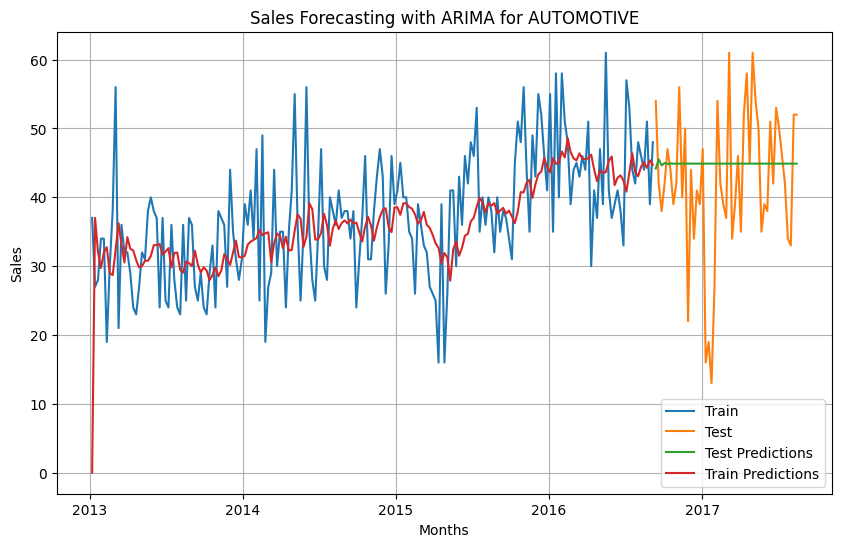

-------------------RMSE-------------------
Test RMSE: 10.976155396281529
Train RMSE: 8.205414197391077
Accuracy: 0.8235399591231588
------------------------------------------




/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(5, 1, 1)   Log Likelihood                -683.813
Date:                Sun, 23 Jun 2024   AIC                           1381.626
Time:                        11:24:02   BIC                           1404.392
Sample:                    01-07-2013   HQIC                          1390.847
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3468      0.084      4.150      0.000       0.183       0.511
ar.L2          0.1190      0.081      1.472      0.141      -0.039       0.277
ar.L3         -0.0290      0.077     -0.377      0.7

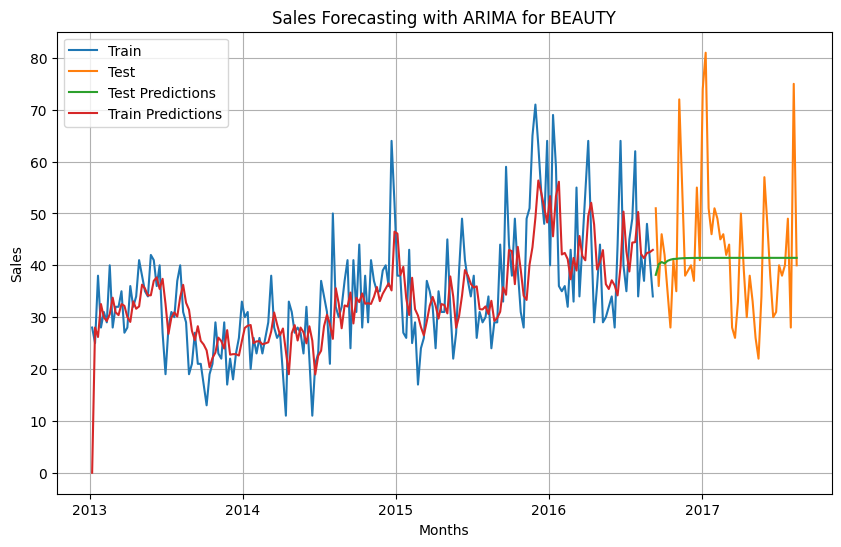

-------------------RMSE-------------------
Test RMSE: 12.865058912992835
Train RMSE: 8.877829882855742
Accuracy: 0.8163646196716386
------------------------------------------


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(3, 1, 1)   Log Likelihood               -1509.630
Date:                Sun, 23 Jun 2024   AIC                           3029.260
Time:                        11:24:02   BIC                           3045.521
Sample:                    01-07-2013   HQIC                          3035.846
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4893      0.176 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


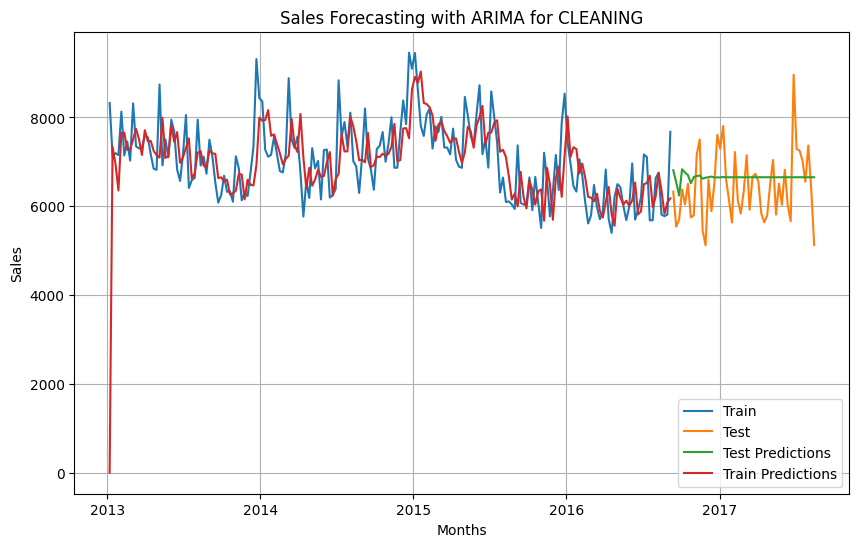

-------------------RMSE-------------------
Test RMSE: 772.9948608874718
Train RMSE: 887.1809179644235
Accuracy: 0.9085066667395724
------------------------------------------




/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(3, 1, 1)   Log Likelihood               -1057.012
Date:                Sun, 23 Jun 2024   AIC                           2124.024
Time:                        11:24:03   BIC                           2140.285
Sample:                    01-07-2013   HQIC                          2130.611
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3841      0.256     -1.502      0.133      -0.885       0.117
ar.L2         -0.1846      0.180     -1.027      0.304      -0.537       0.168
ar.L3         -0.2018      0.104     -1.943      0.0

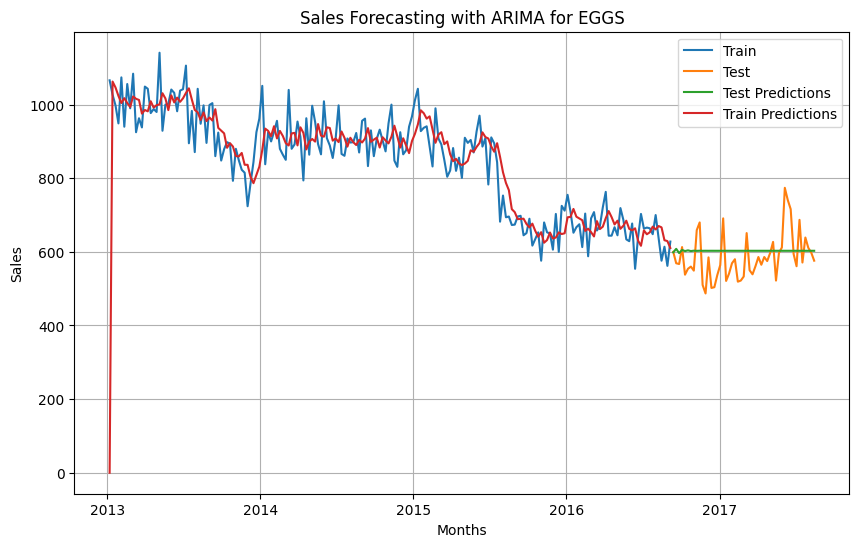

-------------------RMSE-------------------
Test RMSE: 64.48889265011796
Train RMSE: 98.21041984719885
Accuracy: 0.9170319311828132
------------------------------------------


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(3, 1, 1)   Log Likelihood               -1354.281
Date:                Sun, 23 Jun 2024   AIC                           2718.561
Time:                        11:24:03   BIC                           2734.823
Sample:                    01-07-2013   HQIC                          2725.148
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6857      0.212  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


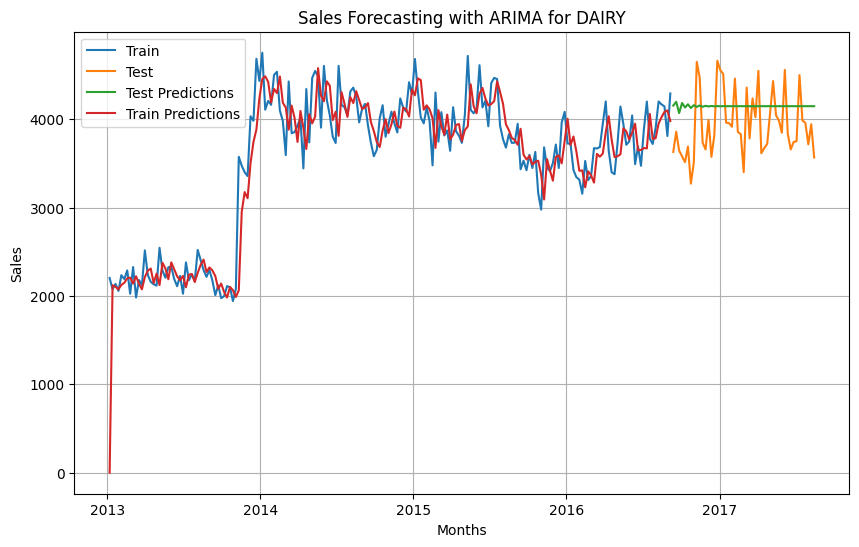

-------------------RMSE-------------------
Test RMSE: 411.6380714220692
Train RMSE: 330.2131984372504
Accuracy: 0.9116689155710447
------------------------------------------




/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(3, 1, 1)   Log Likelihood               -1225.424
Date:                Sun, 23 Jun 2024   AIC                           2460.847
Time:                        11:24:04   BIC                           2477.109
Sample:                    01-07-2013   HQIC                          2467.434
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6376      0.178     -3.578      0.000      -0.987      -0.288
ar.L2         -0.4143      0.106     -3.908      0.000      -0.622      -0.206
ar.L3         -0.4141      0.072     -5.717      0.0

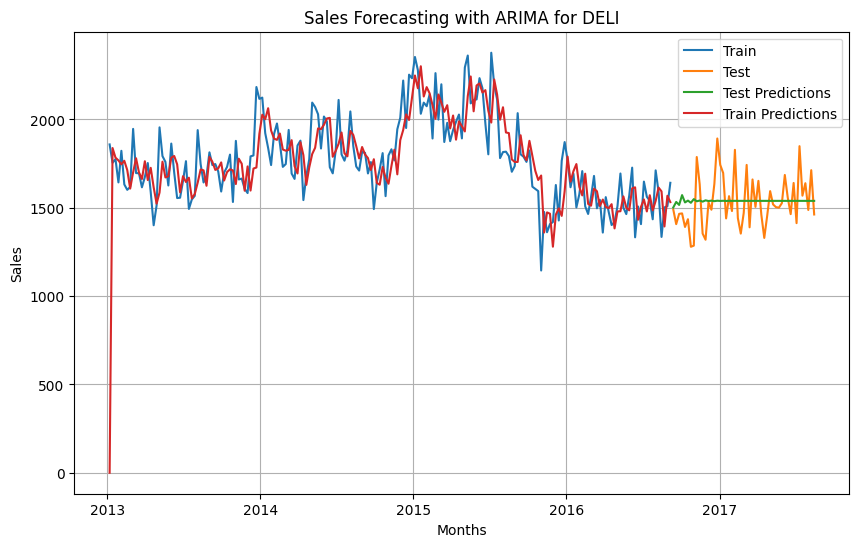

-------------------RMSE-------------------
Test RMSE: 146.26739764533013
Train RMSE: 199.27087608924248
Accuracy: 0.9268505178742
------------------------------------------


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -916.263
Date:                Sun, 23 Jun 2024   AIC                           1838.527
Time:                        11:24:05   BIC                           1848.284
Sample:                    01-07-2013   HQIC                          1842.479
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4659      0.099   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


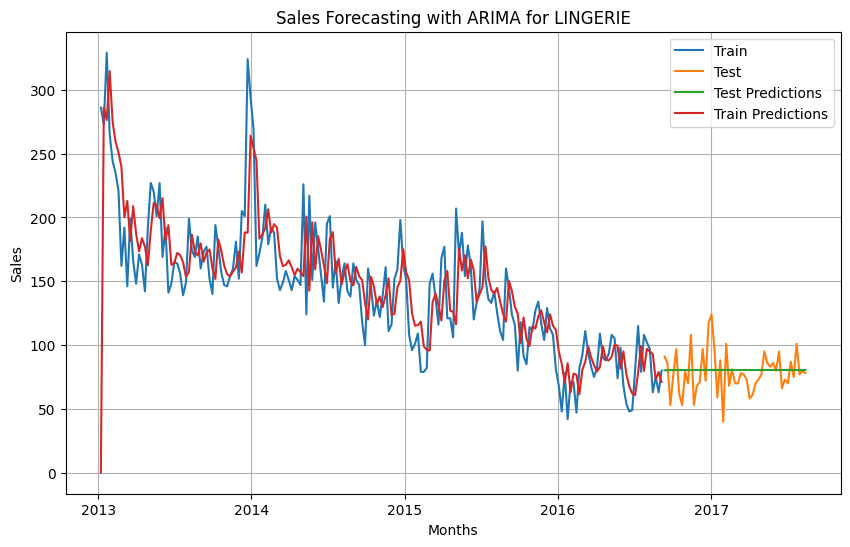

-------------------RMSE-------------------
Test RMSE: 16.5732225201349
Train RMSE: 35.81709950737779
Accuracy: 0.8537348889801949
------------------------------------------


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(3, 1, 1)   Log Likelihood               -1232.694
Date:                Sun, 23 Jun 2024   AIC                           2475.387
Time:                        11:24:05   BIC                           2491.649
Sample:                    01-07-2013   HQIC                          2481.974
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6447      0.147   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


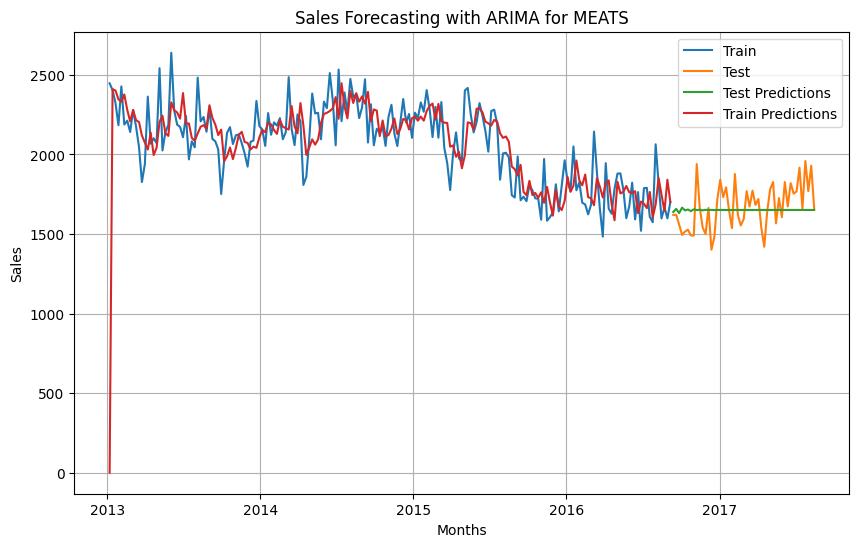

-------------------RMSE-------------------
Test RMSE: 141.37558622793023
Train RMSE: 233.6635228551511
Accuracy: 0.9340395943196768
------------------------------------------




/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                  192
Model:                 ARIMA(3, 1, 1)   Log Likelihood               -1047.280
Date:                Sun, 23 Jun 2024   AIC                           2104.559
Time:                        11:24:06   BIC                           2120.820
Sample:                    01-07-2013   HQIC                          2111.146
                         - 09-05-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0929      0.124     -0.750      0.453      -0.336       0.150
ar.L2         -0.0932      0.101     -0.919      0.358      -0.292       0.106
ar.L3         -0.2063      0.096     -2.138      0.0

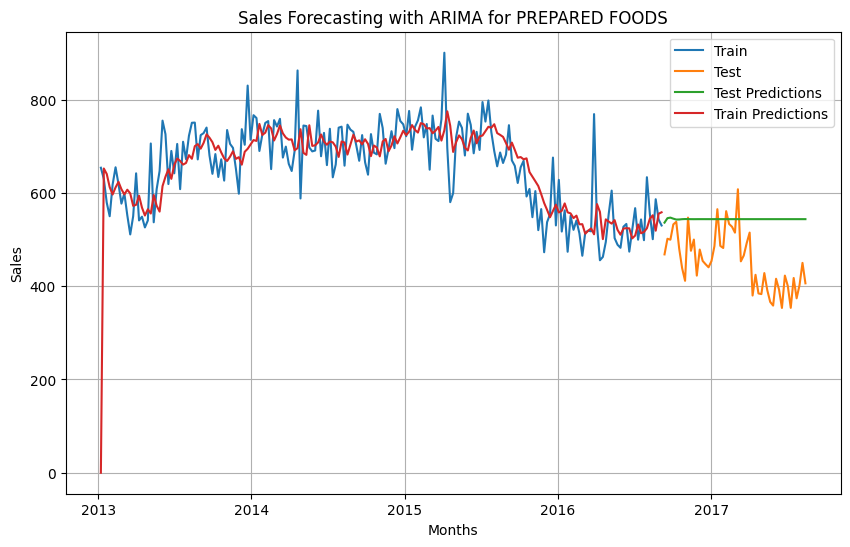

-------------------RMSE-------------------
Test RMSE: 107.95029424024688
Train RMSE: 74.77064412572435
Accuracy: 0.8288810593599611
------------------------------------------




/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-MON will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                    SARIMAX Results                                     
Dep. Variable:                            sales   No. Observations:                  192
Model:             ARIMA(3, 1, 3)x(3, 1, 3, 52)   Log Likelihood               -1103.831
Date:                          Sun, 23 Jun 2024   AIC                           2233.663
Time:                                  11:31:39   BIC                           2271.811
Sample:                              01-07-2013   HQIC                          2249.165
                                   - 09-05-2016                                         
Covariance Type:                            opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1377      3.802     -0.036      0.971      -7.589       7.314
ar.L2          0.0186      2.198      0.008      0.

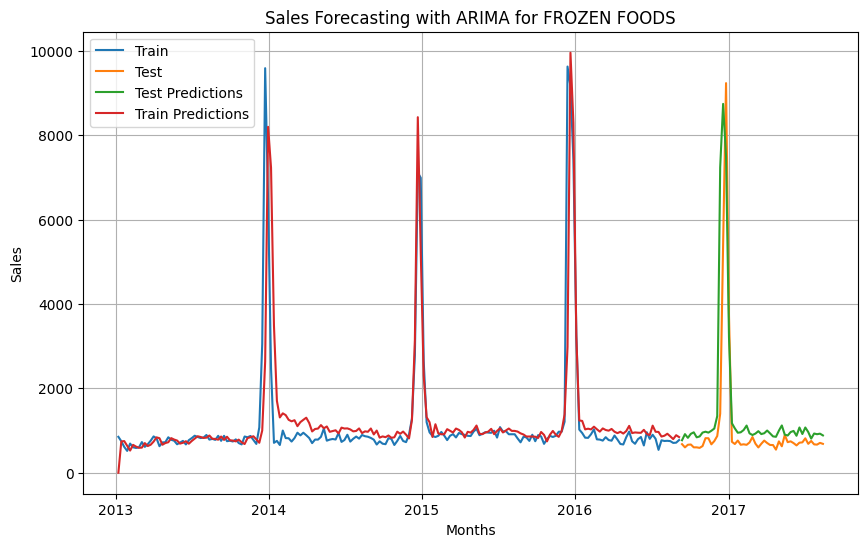

-------------------RMSE-------------------
Test RMSE: 1029.1266385202298
Train RMSE: 865.9926533153468
Accuracy: 0.7273180497403048
------------------------------------------


{'AUTOMOTIVE': {'rmse_test': 10.976155396281529, 'rmse_train': 8.205414197391077, 'accuration_test': 0.8235399591231588, 'model': <statsmodels.tsa.arima.model.ARIMAResultsWrapper object at 0x78eb485f9630>}, 'BEAUTY': {'rmse_test': 12.865058912992835, 'rmse_train': 8.877829882855742, 'accuration_test': 0.8163646196716386, 'model': <statsmodels.tsa.arima.model.ARIMAResultsWrapper object at 0x78eb485fac20>}, 'CLEANING': {'rmse_test': 772.9948608874718, 'rmse_train': 887.1809179644235, 'accuration_test': 0.9085066667395724, 'model': <statsmodels.tsa.arima.model.ARIMAResultsWrapper object at 0x78eb45843f40>}, 'EGGS': {'rmse_test': 64.48889265011796, 'rmse_train': 98.21041984719885, 'accuration_test': 0.9170319311828132, 'model': <statsmodels.tsa.arima.model.ARIMAResultsWrapper object at 0x78eb4847eb60>}, 'DAIRY': {'r

In [29]:
arima_results = {}

for family in familyScope:
  rmse_test,rmse_train,accuration_test,model = arima_try_to_predict(family)
  arima_results[family] = {
    'rmse_test':rmse_test,
    'rmse_train':rmse_train,
    'accuration_test':accuration_test,
    'model':model,
  }

print(arima_results)

In [46]:
def add_features(raw_data):
  # Extract date
  extract_date = DatetimeFeatures(features_to_extract = ["year", "month",'week','quarter'])
  date_data = extract_date.fit_transform(raw_data[['date']])
  raw_data = pd.concat([raw_data, date_data], axis=1)

  # Add Lag Features
  extract_lag_sales = LagFeatures(periods=[1,2,3,4],drop_original=True)
  lag_sales = extract_lag_sales.fit_transform(raw_data[['sales']])
  raw_data = pd.concat([raw_data, lag_sales], axis=1)

  # Add roll_window features
  raw_data['sales_rolling_5'] = raw_data['sales'].rolling(window=5).mean()
  raw_data['sales_rolling_10'] = raw_data['sales'].rolling(window=10).mean()
  raw_data['sales_rolling_20'] = raw_data['sales'].rolling(window=20).mean()

  raw_data = raw_data.dropna()

  return raw_data

In [47]:
def add_features_to_data(family):
  family_data = filtered_data[family].drop(columns=['index','family'])
  family_data = add_features(family_data)
  return family_data

In [48]:
from sklearn.model_selection import train_test_split

def prepare_train_data_for(family):
  data_to_train = add_features_to_data(family).reset_index()
  data_to_train = data_to_train.set_index('date')
  data_to_train = data_to_train.drop(columns=['index'])

  features = data_to_train.drop(columns=['sales'])
  target = data_to_train['sales']

  X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, shuffle = False)

  return X_train,X_test,y_train,y_test

In [33]:
from sklearn.ensemble import RandomForestRegressor

def random_forest_try_to_predict(family):
  X_train,X_test,y_train,y_test = prepare_train_data_for(family)

  RF_regressor = RandomForestRegressor(n_estimators = 300,max_features="sqrt", random_state = 100)
  RF_regressor.fit(X_train, y_train.ravel())

  forecast_test = RF_regressor.predict(X_test)
  forecast_train = RF_regressor.predict(X_train)

  rmse_test = np.sqrt(mean_squared_error(y_test, forecast_test))
  rmse_train = np.sqrt(mean_squared_error(y_train, forecast_train))
  accuration_test = np.mean(np.where(y_test>=forecast_test, forecast_test/y_test, y_test/forecast_test))

  # Plot predictions
  plt.figure(figsize=(10, 6))
  plt.plot(X_train.index, y_train, label='Train')
  plt.plot(X_test.index, y_test, label='Test')
  plt.plot(X_test.index, forecast_test, label='Test Predictions')
  plt.plot(X_train.index, forecast_train, label='Train Predictions')
  plt.title(f'Sales Forecasting with RANDOM FOREST for {family}')
  plt.xlabel('Months')
  plt.ylabel('Sales')
  plt.legend()
  plt.grid(True)
  plt.show()

  print('-------------------RMSE-------------------')
  print(f'Test RMSE: {rmse_test}')
  print(f'Train RMSE: {rmse_train}')
  print(f'Accuracy: {accuration_test}')
  print('------------------------------------------\n\n')

  return rmse_test,rmse_train,accuration_test,RF_regressor

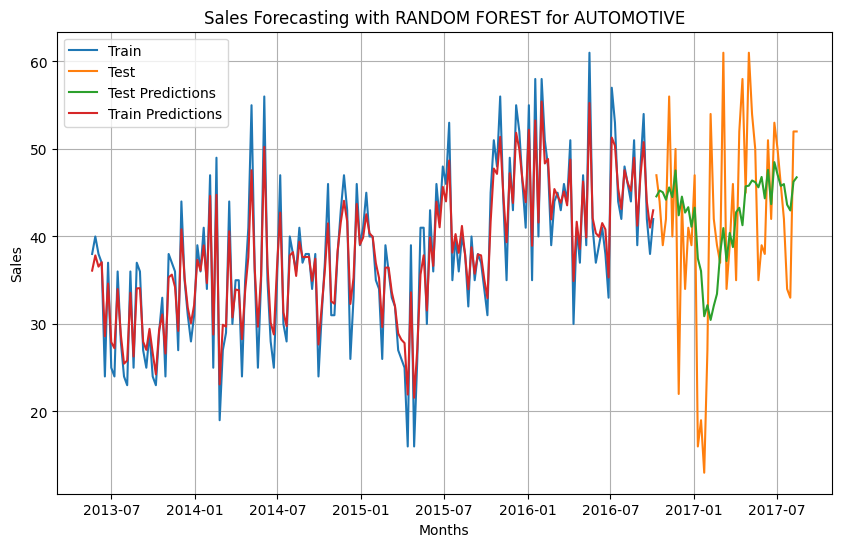

-------------------RMSE-------------------
Test RMSE: 9.654912074197973
Train RMSE: 2.5266560454735547
Accuracy: 0.8359299136346301
------------------------------------------




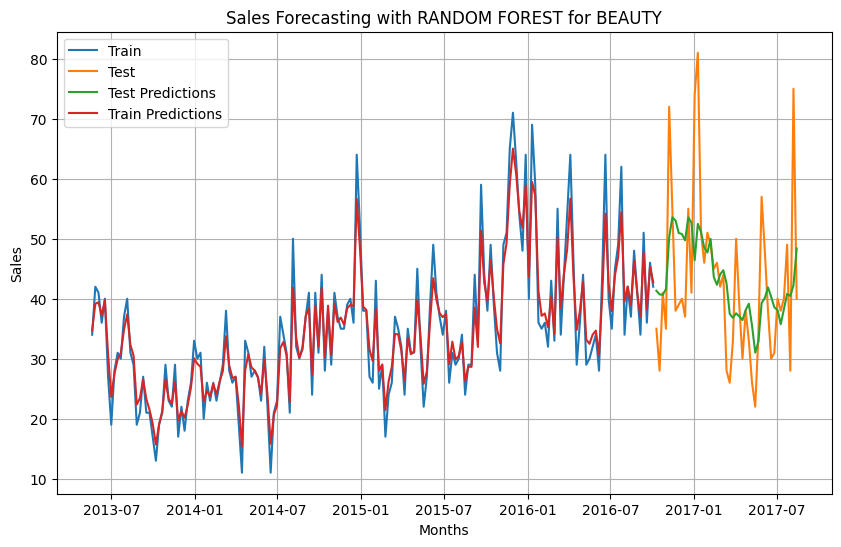

-------------------RMSE-------------------
Test RMSE: 11.372027149170963
Train RMSE: 3.016101433868697
Accuracy: 0.8340985539290462
------------------------------------------




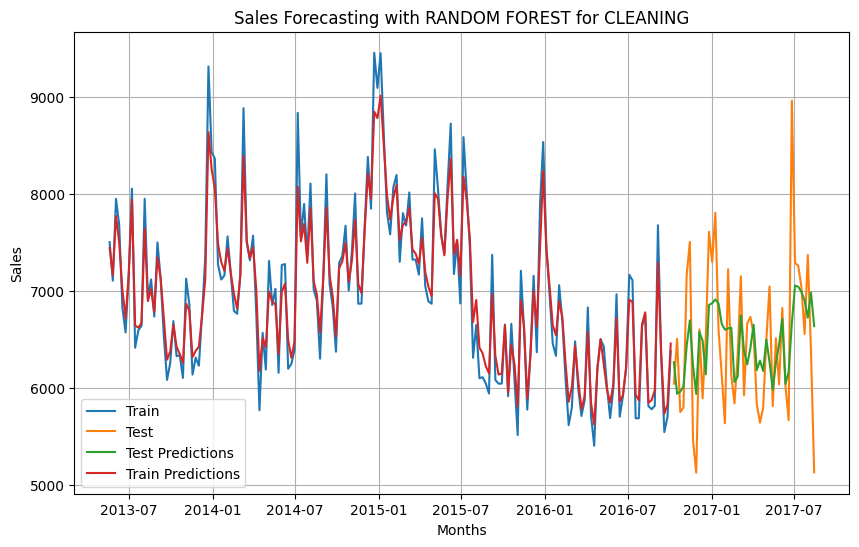

-------------------RMSE-------------------
Test RMSE: 631.6677629432489
Train RMSE: 205.02046623450963
Accuracy: 0.9293916971975695
------------------------------------------




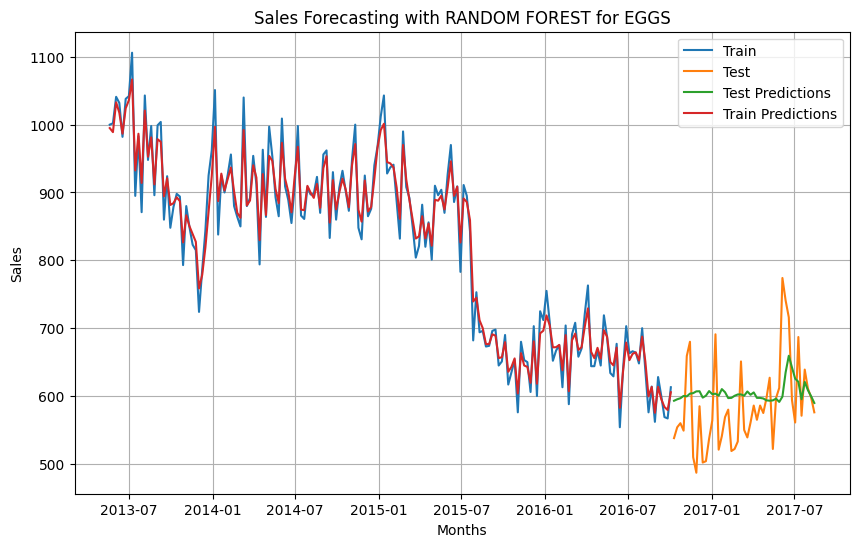

-------------------RMSE-------------------
Test RMSE: 63.45508879183959
Train RMSE: 19.658163122182987
Accuracy: 0.9165006579718399
------------------------------------------




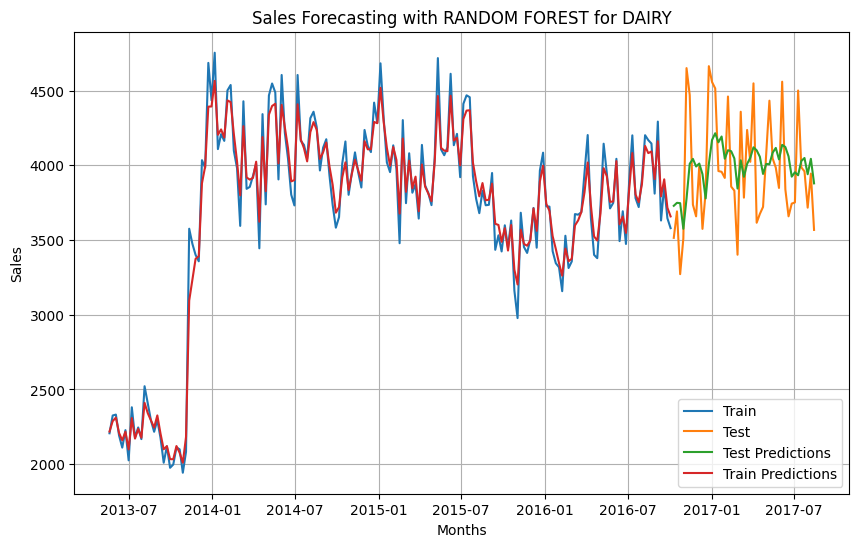

-------------------RMSE-------------------
Test RMSE: 327.21503918318655
Train RMSE: 98.44661198072465
Accuracy: 0.9350601655077497
------------------------------------------




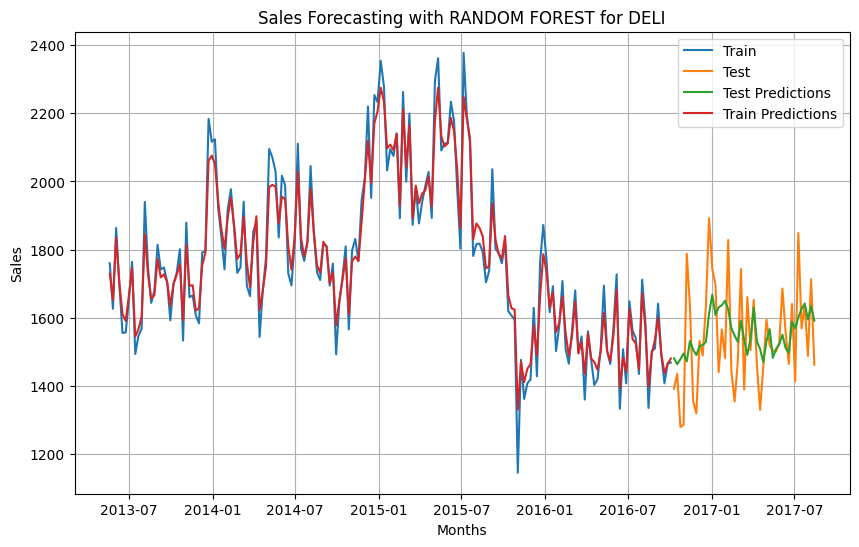

-------------------RMSE-------------------
Test RMSE: 132.77957139271513
Train RMSE: 47.00695561781283
Accuracy: 0.9337900166257364
------------------------------------------




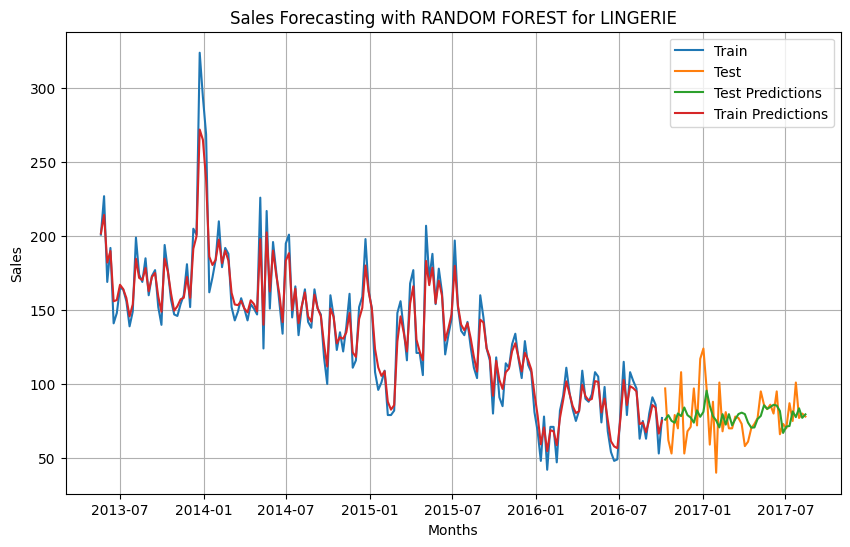

-------------------RMSE-------------------
Test RMSE: 16.933756950081822
Train RMSE: 9.573348851027925
Accuracy: 0.858710145171447
------------------------------------------




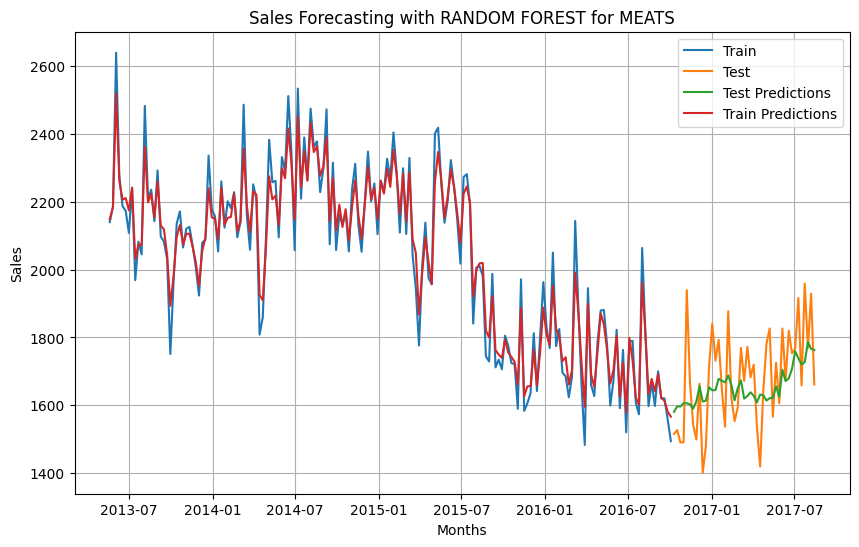

-------------------RMSE-------------------
Test RMSE: 123.40900746184832
Train RMSE: 49.51454575405752
Accuracy: 0.9423907918124649
------------------------------------------




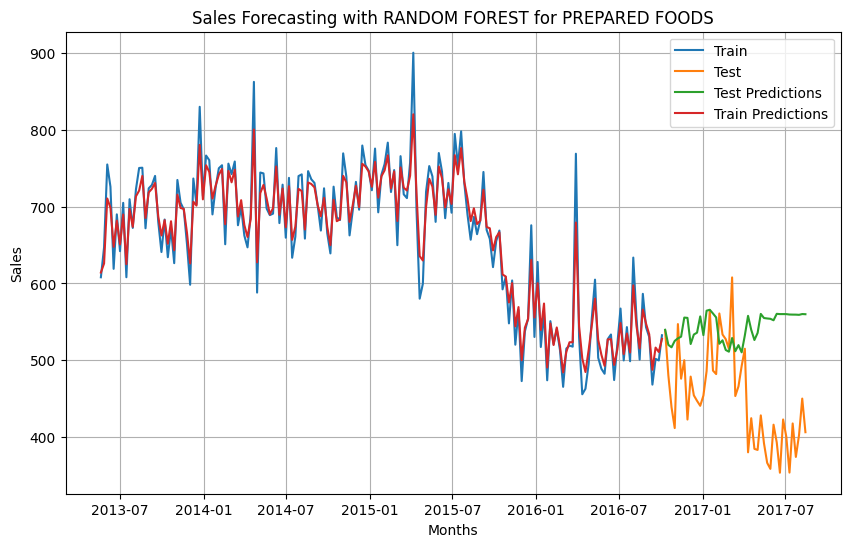

-------------------RMSE-------------------
Test RMSE: 116.35461830666715
Train RMSE: 19.962495902291437
Accuracy: 0.8206116922699325
------------------------------------------




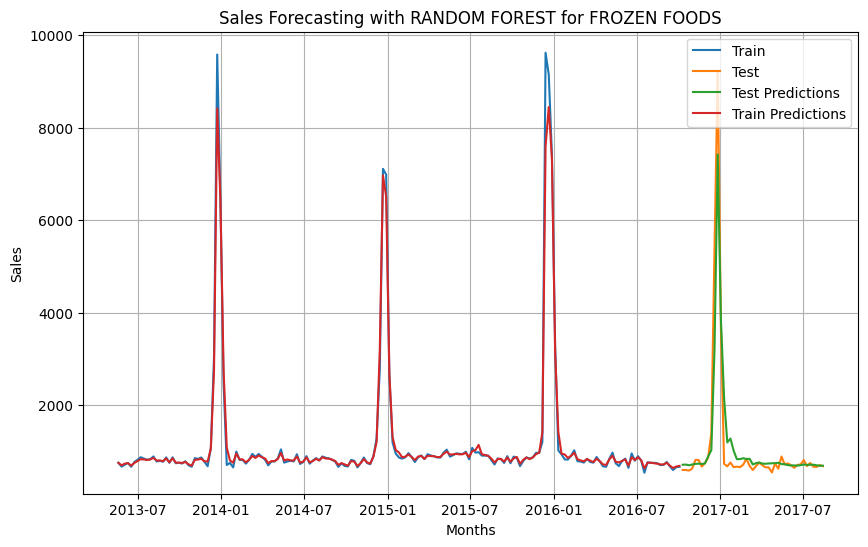

-------------------RMSE-------------------
Test RMSE: 499.0285234904587
Train RMSE: 200.8290341151536
Accuracy: 0.8642717633009358
------------------------------------------


{'AUTOMOTIVE': {'rmse_test': 9.654912074197973, 'rmse_train': 2.5266560454735547, 'accuration_test': 0.8359299136346301, 'model': RandomForestRegressor(max_features='sqrt', n_estimators=300, random_state=100)}, 'BEAUTY': {'rmse_test': 11.372027149170963, 'rmse_train': 3.016101433868697, 'accuration_test': 0.8340985539290462, 'model': RandomForestRegressor(max_features='sqrt', n_estimators=300, random_state=100)}, 'CLEANING': {'rmse_test': 631.6677629432489, 'rmse_train': 205.02046623450963, 'accuration_test': 0.9293916971975695, 'model': RandomForestRegressor(max_features='sqrt', n_estimators=300, random_state=100)}, 'EGGS': {'rmse_test': 63.45508879183959, 'rmse_train': 19.658163122182987, 'accuration_test': 0.9165006579718399, 'model': RandomForestRegressor(max_features='sqrt', n_estimators=300, random_state=10

In [34]:
random_forest_results = {}

for family in familyScope:
  rmse_test,rmse_train,accuration_test,model = random_forest_try_to_predict(family)
  random_forest_results[family] = {
    'rmse_test':rmse_test,
    'rmse_train':rmse_train,
    'accuration_test':accuration_test,
    'model':model
  }

print(random_forest_results)

In [35]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures

# 'AUTOMOTIVE', 'BEAUTY', 'CLEANING', 'EGGS', 'DELI', 'LINGERIE', 'MEATS', 'PREPARED FOODS', 'FROZEN FOODS'

data_scaler = {
    'AUTOMOTIVE':None,
    'LINGERIE':None,
    'CLEANING':MinMaxScaler(feature_range=(0, 1)),
    'DAIRY':MinMaxScaler(feature_range=(0, 1)),
    'DELI':MinMaxScaler(feature_range=(0, 1)),
    'EGGS':None,
    'FROZEN FOODS':MinMaxScaler(feature_range=(0, 1)),
    'MEATS':MinMaxScaler(feature_range=(0, 1)),
    'PREPARED FOODS':MinMaxScaler(feature_range=(0, 1)),
    'BEAUTY':None,
}

def lasso_regression_try_to_predict(family):
  X_train,X_test,y_train,y_test = prepare_train_data_for(family)

  steps = [
    ('scalar', data_scaler[family]),
    ('poly', PolynomialFeatures(degree=3)),
    ('model', Lasso(alpha=0.14, fit_intercept=True, max_iter=3000))
  ]

  lasso_pipe = Pipeline(steps)
  lasso_pipe.fit(X_train, y_train)

  forecast_test = lasso_pipe.predict(X_test)
  forecast_train = lasso_pipe.predict(X_train)

  rmse_test = np.sqrt(mean_squared_error(y_test, forecast_test))
  rmse_train = np.sqrt(mean_squared_error(y_train, forecast_train))
  accuration_test = np.mean(np.where(y_test>=forecast_test, forecast_test/y_test, y_test/forecast_test))

  # Plot predictions
  plt.figure(figsize=(10, 6))
  plt.plot(X_train.index, y_train, label='Train')
  plt.plot(X_test.index, y_test, label='Test')
  plt.plot(X_test.index, forecast_test, label='Test Predictions')
  plt.plot(X_train.index, forecast_train, label='Train Predictions')
  plt.title(f'Sales Forecasting with Lasso Regression for {family}')
  plt.xlabel('Months')
  plt.ylabel('Sales')
  plt.legend()
  plt.grid(True)
  plt.show()

  print('-------------------RMSE-------------------')
  print(f'Test RMSE: {rmse_test}')
  print(f'Train RMSE: {rmse_train}')
  print(f'Accuracy: {accuration_test}')
  print('------------------------------------------\n\n')

  return rmse_test,rmse_train,accuration_test,lasso_pipe

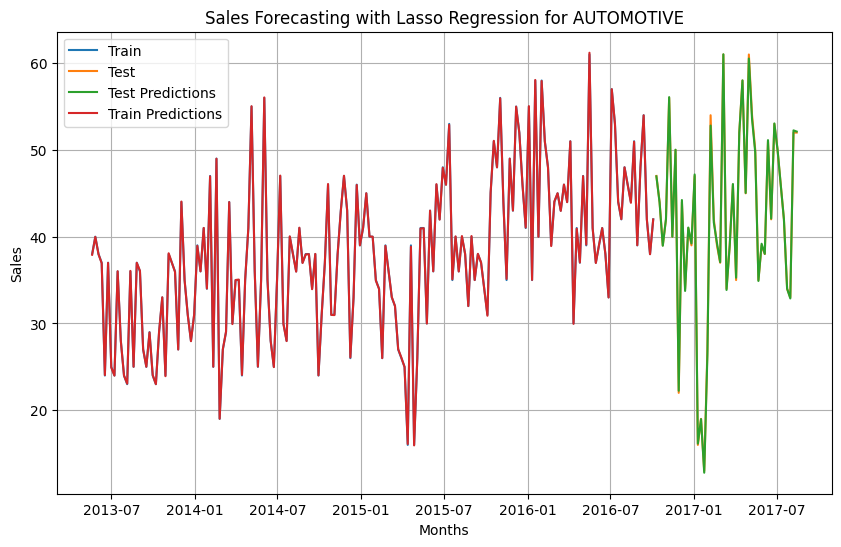

-------------------RMSE-------------------
Test RMSE: 0.2605200160923769
Train RMSE: 0.04944219690651709
Accuracy: 0.9957726489762411
------------------------------------------




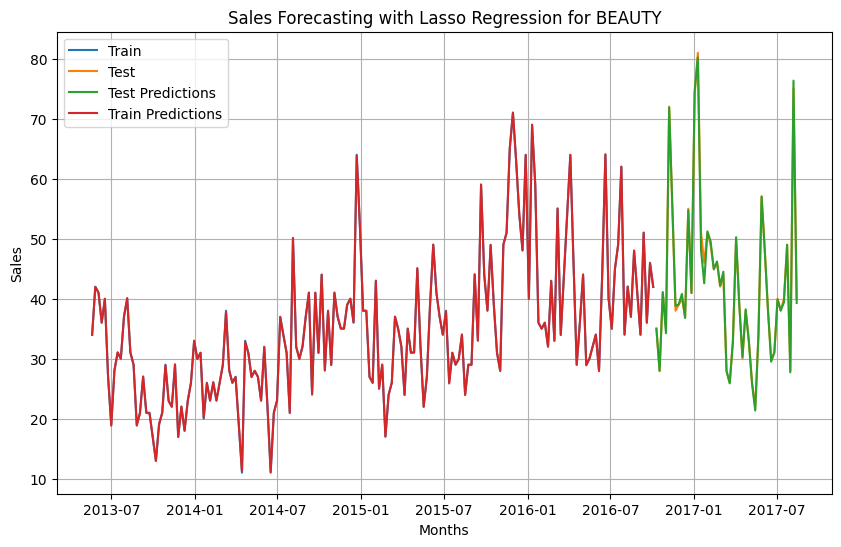

-------------------RMSE-------------------
Test RMSE: 0.7914926116371429
Train RMSE: 0.06674585665661245
Accuracy: 0.9900186122779658
------------------------------------------




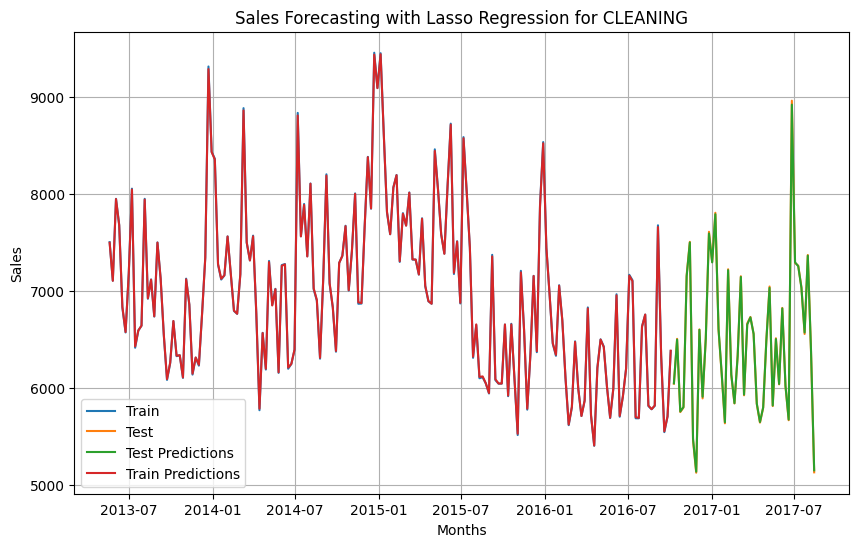

-------------------RMSE-------------------
Test RMSE: 11.272629077341273
Train RMSE: 7.87756078724121
Accuracy: 0.9985948632978202
------------------------------------------




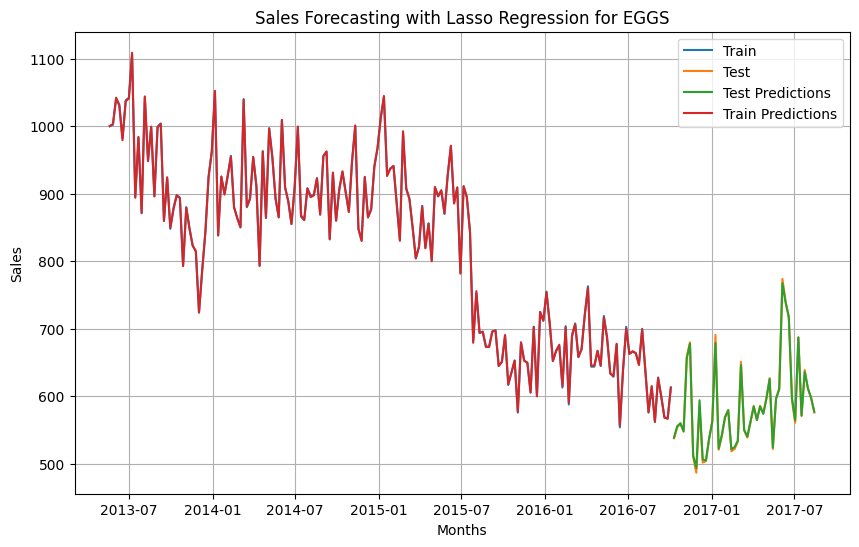

-------------------RMSE-------------------
Test RMSE: 3.3193237461463294
Train RMSE: 1.1014275328880327
Accuracy: 0.9960721271607268
------------------------------------------




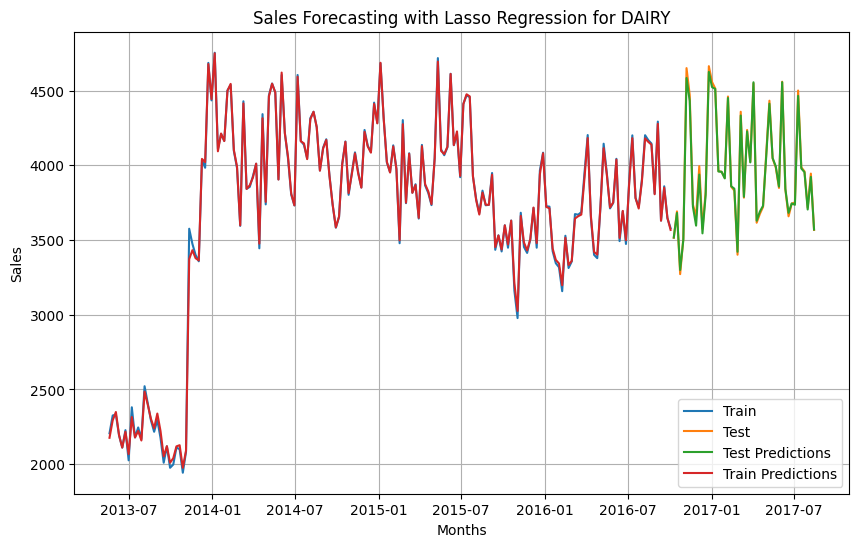

-------------------RMSE-------------------
Test RMSE: 23.049543692460663
Train RMSE: 23.224332875459677
Accuracy: 0.9958635544991721
------------------------------------------




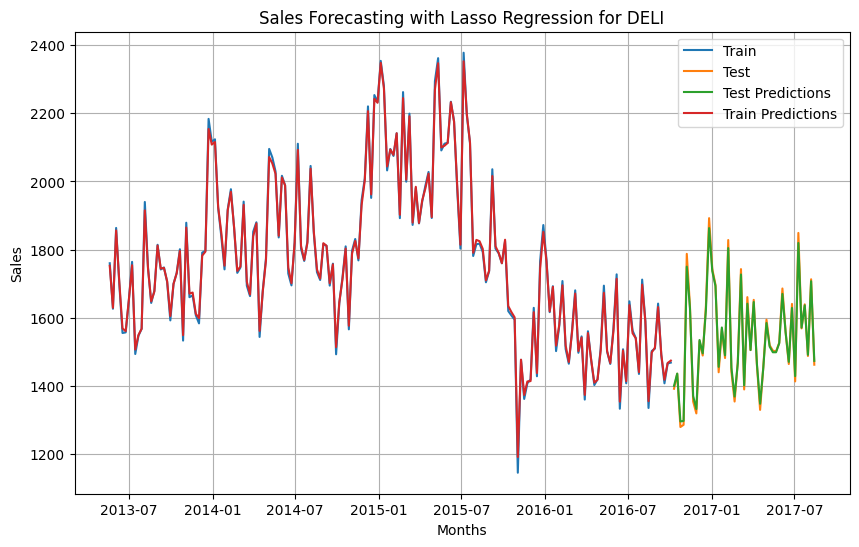

-------------------RMSE-------------------
Test RMSE: 13.152133513355029
Train RMSE: 10.303396703531646
Accuracy: 0.993461784156606
------------------------------------------




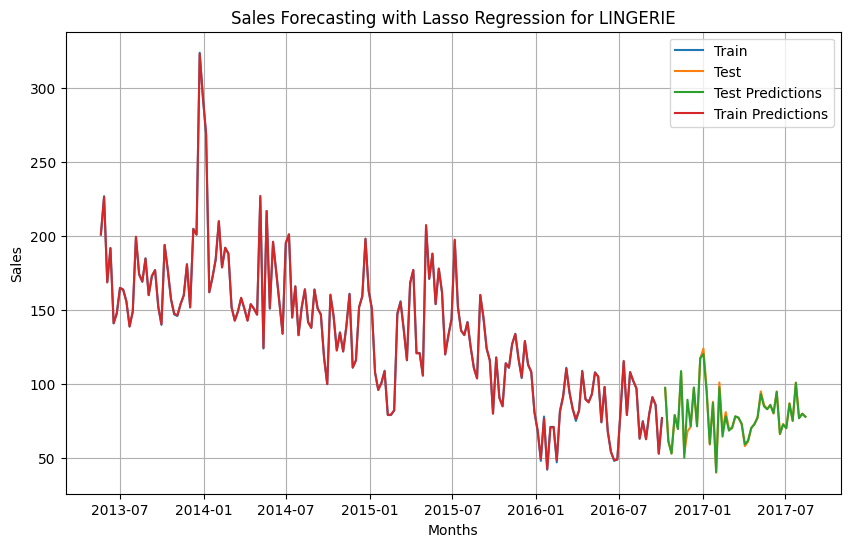

-------------------RMSE-------------------
Test RMSE: 3.4341649433290815
Train RMSE: 0.4001116161872198
Accuracy: 0.9841590626623955
------------------------------------------




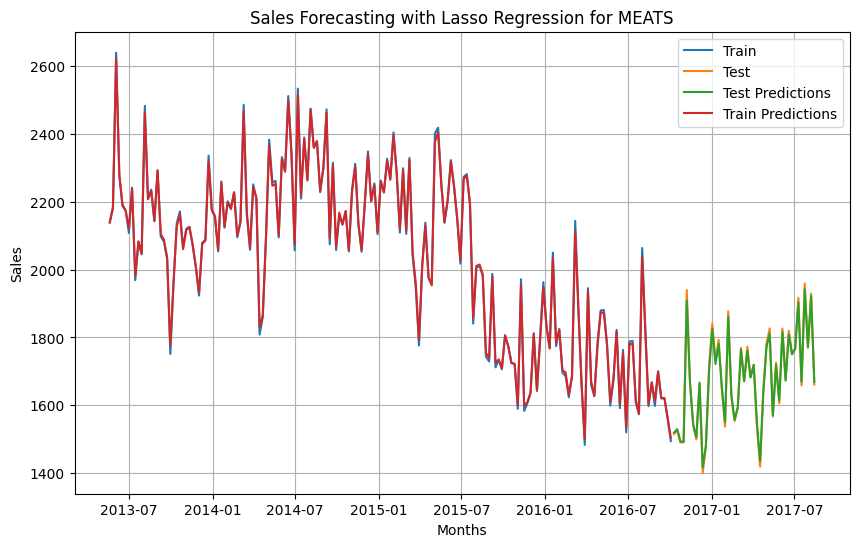

-------------------RMSE-------------------
Test RMSE: 10.075672871217073
Train RMSE: 9.044910272940829
Accuracy: 0.9954172595441219
------------------------------------------




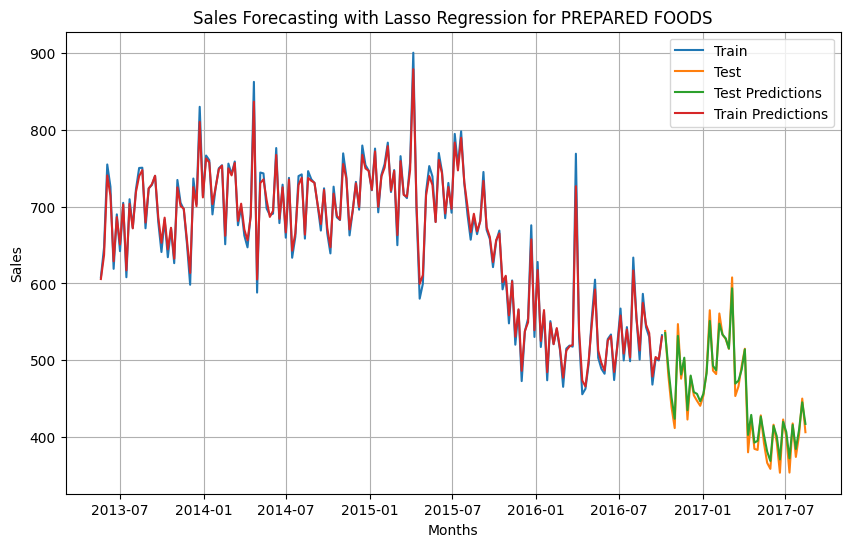

-------------------RMSE-------------------
Test RMSE: 9.656133305802692
Train RMSE: 8.581837768613989
Accuracy: 0.9819703223547601
------------------------------------------




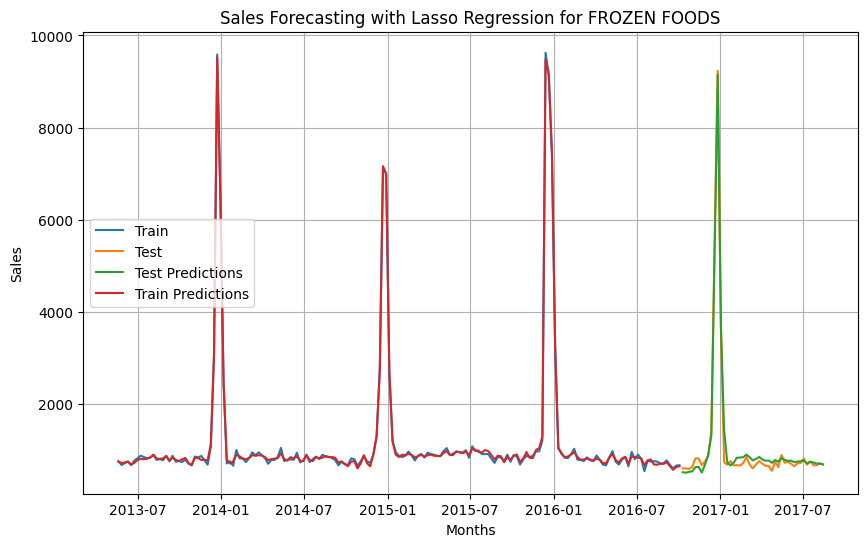

-------------------RMSE-------------------
Test RMSE: 146.19052091172756
Train RMSE: 46.250401303665214
Accuracy: 0.8869964063514656
------------------------------------------


{'AUTOMOTIVE': {'rmse_test': 0.2605200160923769, 'rmse_train': 0.04944219690651709, 'accuration_test': 0.9957726489762411, 'model': Pipeline(steps=[('scalar', None), ('poly', PolynomialFeatures(degree=3)),
                ('model', Lasso(alpha=0.14, max_iter=3000))])}, 'BEAUTY': {'rmse_test': 0.7914926116371429, 'rmse_train': 0.06674585665661245, 'accuration_test': 0.9900186122779658, 'model': Pipeline(steps=[('scalar', None), ('poly', PolynomialFeatures(degree=3)),
                ('model', Lasso(alpha=0.14, max_iter=3000))])}, 'CLEANING': {'rmse_test': 11.272629077341273, 'rmse_train': 7.87756078724121, 'accuration_test': 0.9985948632978202, 'model': Pipeline(steps=[('scalar', MinMaxScaler()),
                ('poly', PolynomialFeatures(degree=3)),
                ('model', Lasso(alpha=0.14, max_iter=3000))])

In [36]:
lasso_results = {}

for family in familyScope:
  rmse_test,rmse_train,accuration_test,model = lasso_regression_try_to_predict(family)
  lasso_results[family] = {
    'rmse_test':rmse_test,
    'rmse_train':rmse_train,
    'accuration_test':accuration_test,
    'model':model
  }

print(lasso_results)

In [37]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import tensorflow

import random

# Set seeds
np.random.seed(25)
tensorflow.random.set_seed(25)
random.seed(25)

In [38]:
scaler = MinMaxScaler(feature_range=(0, 1))
look_back = 10

def create_dataset(dataset, look_back=1):
  X, y = [], []
  for i in range(len(dataset) - look_back - 1):
      a = dataset[i:(i + look_back), 0]
      X.append(a)
      y.append(dataset[i + look_back, 0])
  return np.array(X), np.array(y)

def prepare_train_data_for(family):
  family_data = filtered_data[family]
  family_data = family_data[['sales']]

  scaled_data = scaler.fit_transform(family_data)
  X, y = create_dataset(scaled_data, look_back)

  X = np.reshape(X, (X.shape[0], X.shape[1], 1))

  train_size = int(len(X) * 0.67)
  test_size = len(X) - train_size
  X_train, X_test = X[0:train_size], X[train_size:len(X)]
  y_train, y_test = y[0:train_size], y[train_size:len(y)]

  return X_train,X_test,y_train,y_test,scaled_data

In [39]:
def LSTM_try_to_predict(family):
  X_train,X_test,y_train,y_test,scaled_data = prepare_train_data_for(family)

  # Build the LSTM model
  model = Sequential()
  model.add(LSTM(50, return_sequences=True, input_shape=(10, 1)))
  model.add(LSTM(50))
  model.add(Dense(1))

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam')

  # Train the model
  model.fit(X_train, y_train, epochs=10, batch_size=1, verbose=0)

  # Make predictions
  train_predict = model.predict(X_train)
  test_predict = model.predict(X_test)

  # Invert predictions
  train_predict = scaler.inverse_transform(train_predict)
  y_train = scaler.inverse_transform([y_train])
  test_predict = scaler.inverse_transform(test_predict)
  y_test = scaler.inverse_transform([y_test])

  #  Plot the results
  train_plot = np.empty_like(scaled_data)
  train_plot[:, :] = np.nan
  train_plot[look_back:len(train_predict) + look_back, :] = train_predict

  test_plot = np.empty_like(scaled_data)
  test_plot[:, :] = np.nan
  test_plot[len(train_predict) + look_back:len(scaled_data) - 1, :] = test_predict

  plt.figure(figsize=(20, 6))
  plt.plot(scaler.inverse_transform(scaled_data))
  plt.plot(train_plot)
  plt.plot(test_plot)
  plt.show()

  rmse_test = np.sqrt(mean_squared_error(y_test[0], test_predict[:, 0]))
  rmse_train = np.sqrt(mean_squared_error(y_train[0], train_predict[:, 0]))
  accuration_test = np.mean(np.where(y_test[0]>=test_predict[:, 0], test_predict[:, 0]/y_test[0], y_test[0]/test_predict[:, 0]))

  print('-------------------RMSE-------------------')
  print(f'Test RMSE: {rmse_test}')
  print(f'Train RMSE: {rmse_train}')
  print(f'Accuracy: {accuration_test}')
  print('------------------------------------------\n\n')

  return rmse_test,rmse_train,accuration_test,model

3/3 [==============================] - 0s 6ms/step


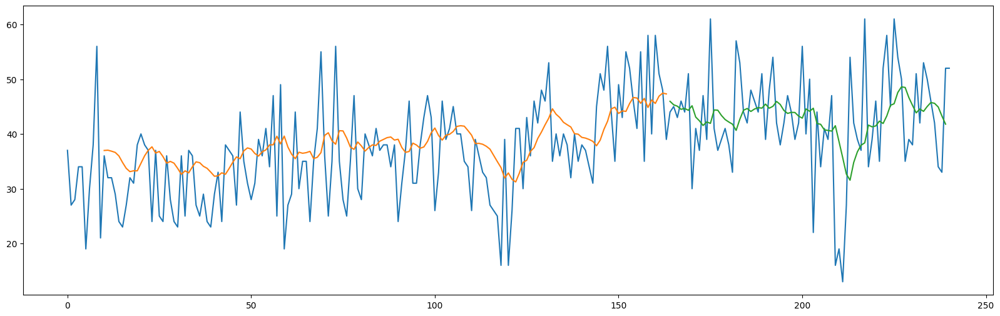

-------------------RMSE-------------------
Test RMSE: 9.339444115819935
Train RMSE: 7.940855694433243
Accuracy: 0.8524381812303592
------------------------------------------


3/3 [==============================] - 0s 7ms/step


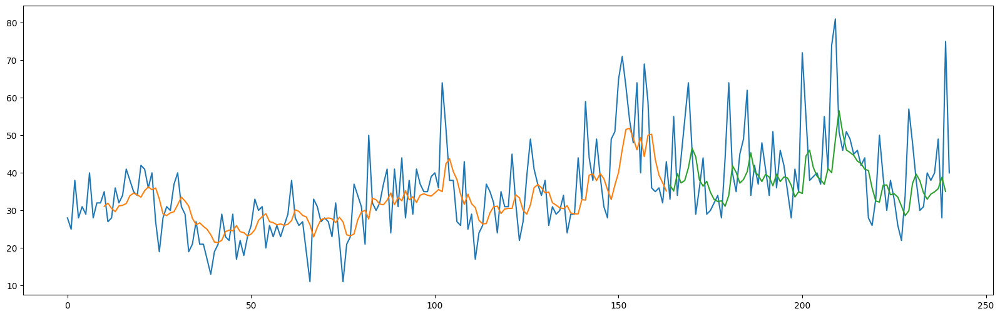

-------------------RMSE-------------------
Test RMSE: 12.598883442602215
Train RMSE: 8.5507393124458
Accuracy: 0.8239530710137696
------------------------------------------


3/3 [==============================] - 0s 8ms/step


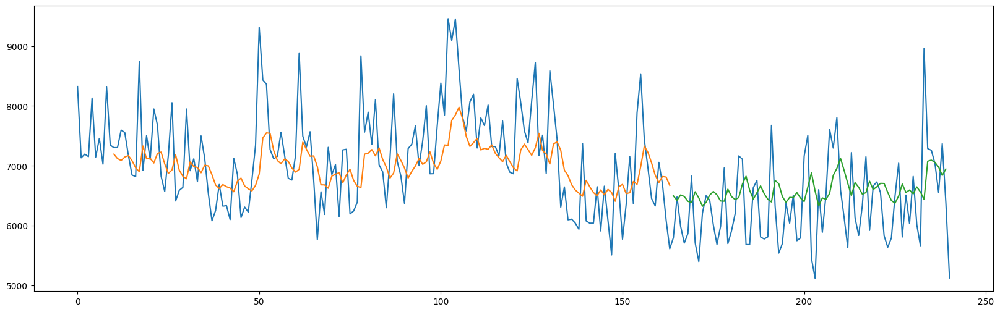

-------------------RMSE-------------------
Test RMSE: 731.0689685716898
Train RMSE: 714.2697594165318
Accuracy: 0.9123311810433457
------------------------------------------


3/3 [==============================] - 0s 10ms/step


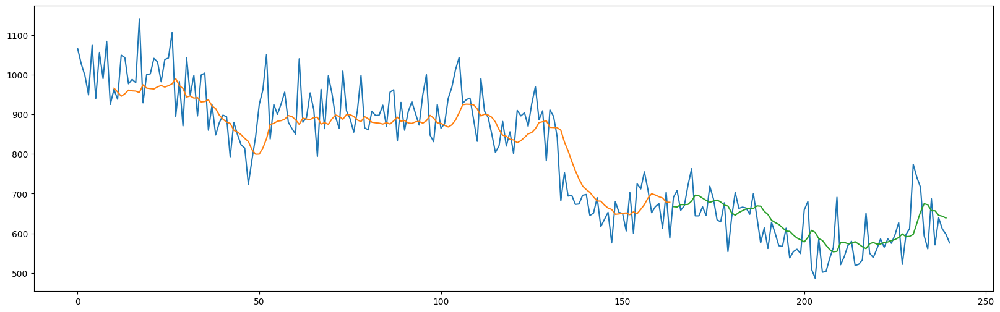

-------------------RMSE-------------------
Test RMSE: 57.63344686635658
Train RMSE: 66.49424909686941
Accuracy: 0.9315027416041168
------------------------------------------


3/3 [==============================] - 0s 8ms/step


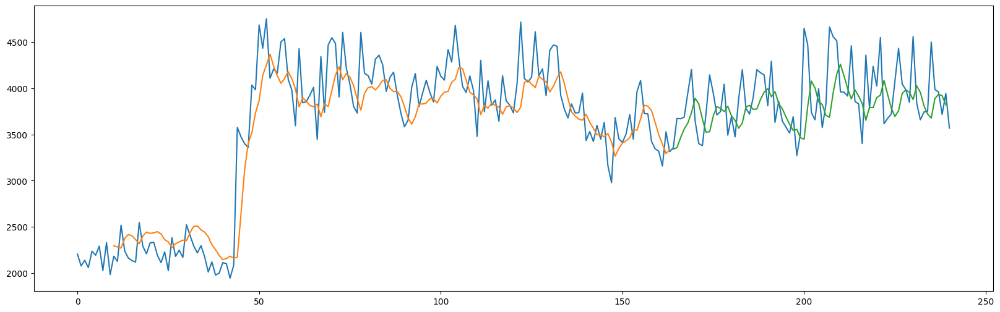

-------------------RMSE-------------------
Test RMSE: 370.2776528338695
Train RMSE: 317.4244435746248
Accuracy: 0.9319499145457351
------------------------------------------


3/3 [==============================] - 0s 8ms/step


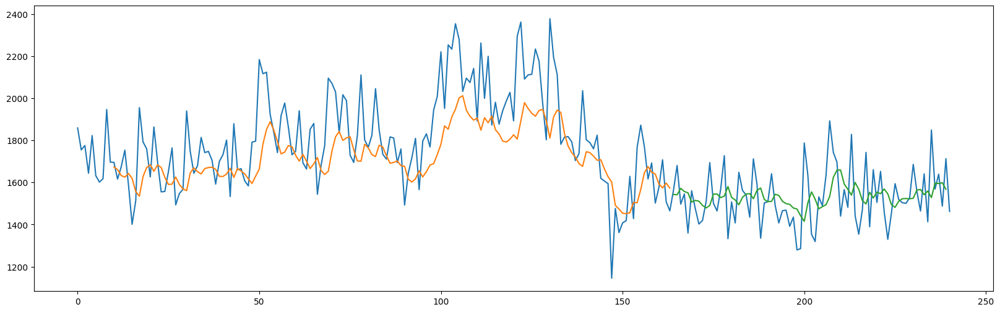

-------------------RMSE-------------------
Test RMSE: 140.80655698044131
Train RMSE: 191.7960630681064
Accuracy: 0.932126157888443
------------------------------------------


3/3 [==============================] - 0s 9ms/step


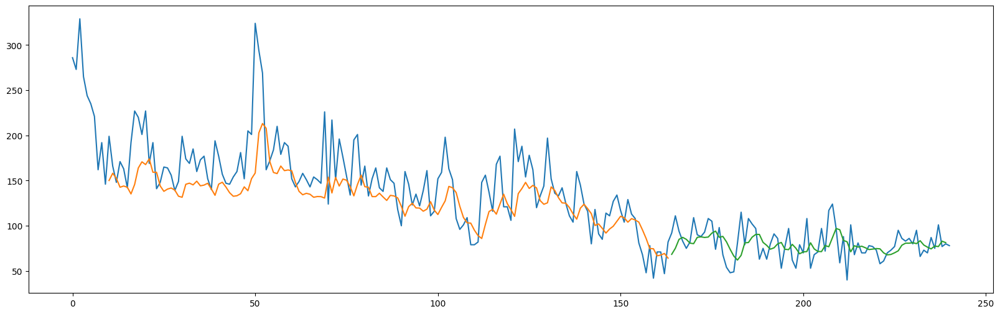

-------------------RMSE-------------------
Test RMSE: 18.480085582674743
Train RMSE: 35.342248440073256
Accuracy: 0.8444880539295391
------------------------------------------


3/3 [==============================] - 0s 8ms/step


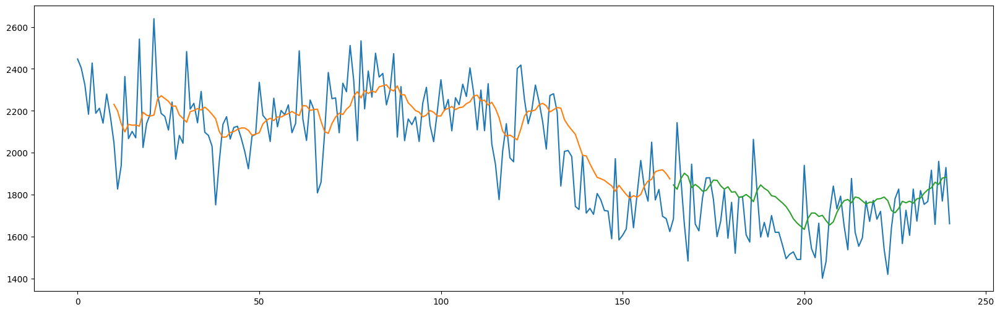

-------------------RMSE-------------------
Test RMSE: 171.0033667634051
Train RMSE: 166.2771949818185
Accuracy: 0.921934786049371
------------------------------------------


3/3 [==============================] - 0s 7ms/step


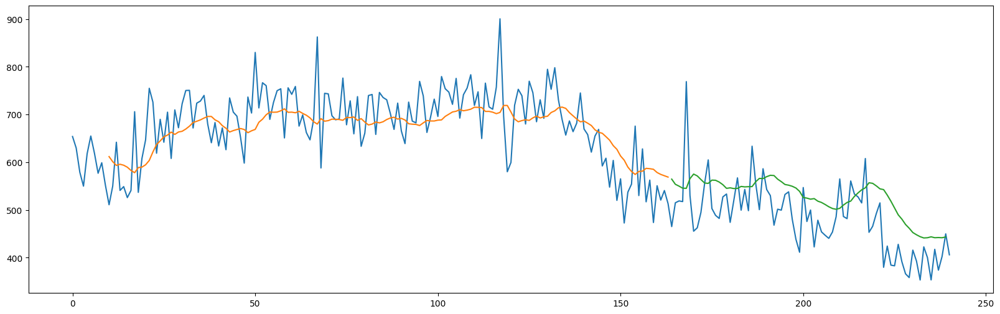

-------------------RMSE-------------------
Test RMSE: 71.56576249358763
Train RMSE: 60.18725544170569
Accuracy: 0.8901925512174929
------------------------------------------


3/3 [==============================] - 0s 8ms/step


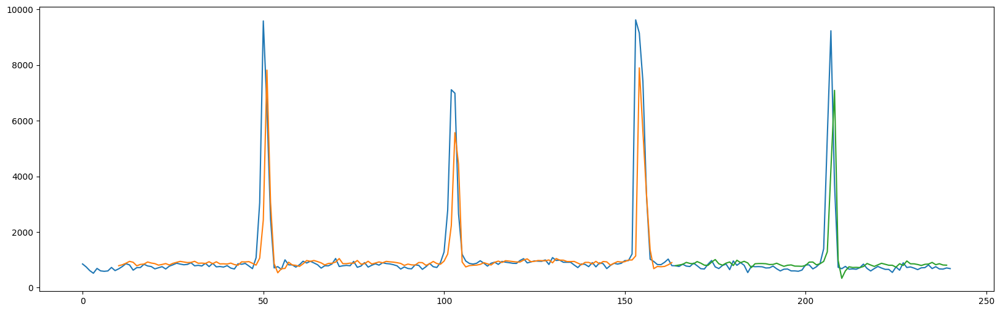

-------------------RMSE-------------------
Test RMSE: 852.5733048066918
Train RMSE: 1043.9126980181481
Accuracy: 0.8274327138761439
------------------------------------------


{'AUTOMOTIVE': {'rmse_test': 9.339444115819935, 'rmse_train': 7.940855694433243, 'accuration_test': 0.8524381812303592, 'model': <keras.src.engine.sequential.Sequential object at 0x78eb44f3fc40>}, 'BEAUTY': {'rmse_test': 12.598883442602215, 'rmse_train': 8.5507393124458, 'accuration_test': 0.8239530710137696, 'model': <keras.src.engine.sequential.Sequential object at 0x78ea9cfb7af0>}, 'CLEANING': {'rmse_test': 731.0689685716898, 'rmse_train': 714.2697594165318, 'accuration_test': 0.9123311810433457, 'model': <keras.src.engine.sequential.Sequential object at 0x78eb437b0d90>}, 'EGGS': {'rmse_test': 57.63344686635658, 'rmse_train': 66.49424909686941, 'accuration_test': 0.9315027416041168, 'model': <keras.src.engine.sequential.Sequential object at 0x78ea9cfb67d0>}, 'DAIRY': {'rmse_test': 370.2776528338695, 'rmse_tra

In [40]:
lstm_results = {}

for family in familyScope:
  rmse_test,rmse_train,accuration_test,model = LSTM_try_to_predict(family)
  lstm_results[family] = {
    'rmse_test':rmse_test,
    'rmse_train':rmse_train,
    'accuration_test':accuration_test,
    'model':model
  }

print(lstm_results)

In [41]:
results = []

for family in familyScope:

  min_rmse_test   = min(
                      arima_results[family]['rmse_test'],
                      random_forest_results[family]['rmse_test'],
                      lasso_results[family]['rmse_test'],
                      lstm_results[family]['rmse_test']
                    )

  min_rmse_train  = min(
                      arima_results[family]['rmse_train'],
                      random_forest_results[family]['rmse_train'],
                      lasso_results[family]['rmse_train'],
                      lstm_results[family]['rmse_train']
                    )

  best_accuracy   = max(
                      arima_results[family]['accuration_test'],
                      random_forest_results[family]['accuration_test'],
                      lasso_results[family]['accuration_test'],
                      lstm_results[family]['accuration_test']
                    )

  if best_accuracy == arima_results[family]['accuration_test']:
    best_model = 'ARIMA/SARIMA'
  elif best_accuracy == random_forest_results[family]['accuration_test']:
    best_model = 'Random Forest'
  elif best_accuracy == lasso_results[family]['accuration_test']:
    best_model = 'Lasso Regression'
  else:
    best_model = 'LSTM'

  results.append({
    'family':family,

    'best_model':best_model,
    'best_accuracy':best_accuracy,
    'best_rmse_test':min_rmse_test,
    'best_rmse_train':min_rmse_train,

    'accuracy_test_arima':arima_results[family]['accuration_test'],
    'accuracy_test_random_forest':random_forest_results[family]['accuration_test'],
    'accuracy_test_lasso':lasso_results[family]['accuration_test'],
    'accuracy_test_lstm':lstm_results[family]['accuration_test'],

    # 'rmse_test_arima':arima_results[family]['rmse_test'],
    # 'rmse_test_random_forest':random_forest_results[family]['rmse_test'],
    # 'rmse_test_lasso':lasso_results[family]['rmse_test'],
    # 'rmse_test_lstm':lstm_results[family]['rmse_test'],

    # 'rmse_train_arima':arima_results[family]['rmse_train'],
    # 'rmse_train_random_forest':random_forest_results[family]['rmse_train'],
    # 'rmse_train_lasso':lasso_results[family]['rmse_train'],
    # 'rmse_train_lstm':lstm_results[family]['rmse_train'],
  })

result_table = pd.DataFrame(data = results)
result_table

,family,best_model,best_accuracy,best_rmse_test,best_rmse_train,accuracy_test_arima,accuracy_test_random_forest,accuracy_test_lasso,accuracy_test_lstm
0,AUTOMOTIVE,Lasso Regression,0.995773,0.260520,0.049442,0.823540,0.835930,0.995773,0.852438
1,BEAUTY,Lasso Regression,0.990019,0.791493,0.066746,0.816365,0.834099,0.990019,0.823953
2,CLEANING,Lasso Regression,0.998595,11.272629,7.877561,0.908507,0.929392,0.998595,0.912331
3,EGGS,Lasso Regression,0.996072,3.319324,1.101428,0.917032,0.916501,0.996072,0.931503
4,DAIRY,Lasso Regression,0.995864,23.049544,23.224333,0.911669,0.935060,0.995864,0.931950
5,DELI,Lasso Regression,0.993462,13.152134,10.303397,0.926851,0.933790,0.993462,0.932126
6,LINGERIE,Lasso Regression,0.984159,3.434165,0.400112,0.853735,0.858710,0.984159,0.844488
7,MEATS,Lasso Regression,0.995417,10.075673,9.044910,0.934040,0.942391,0.995417,0.921935
8,PREPARED FOODS,Lasso Regression,0.981970,9.656133,8.581838,0.828881,0.820612,0.981970,0.890193
9,FROZEN FOODS,Lasso Regression,0.886996,146.190521,46.250401,0.727318,0.864272,0.886996,0.827433


In [61]:
import pickle
from google.colab import files

In [62]:
for family in familyScope:
  best_model = lasso_results[family]['model']
  # Save the model to a file
  with open(f'{family}_best_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)

  files.download(f'{family}_best_model.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [63]:
from sklearn.model_selection import train_test_split

def prepare_train_data_for(family):
  data_to_train = add_features_to_data(family).reset_index()
  data_to_train = data_to_train.set_index('date')
  data_to_train = data_to_train.drop(columns=['index'])

  features = data_to_train.drop(columns=['sales'])
  target = data_to_train['sales']

  X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, shuffle = False)

  return X_train,X_test,y_train,y_test

In [64]:
for family in familyScope:
  X_train,X_test,y_train,y_test = prepare_train_data_for(family)
  with open(f'/content/{family}_best_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)
    predictions = loaded_model.predict(X_test)